/var/folders/j3/pj3kpjws5gj32d8zrny204340000gn/T/ipykernel_40087/2297639528.py:9: DtypeWarning: Columns (10,22,29,31,32,35,36,40,44,45,46,48,51,54,65,84,89,90,93,98,99,100,105,108,115,118,122,123,125,130,134,138,142,143,144,146,149,152,163,166,167,171,172,173,175,178,181,192,194,225,271,272,273,277,304,315,321,325,330,331,335,336,342,348,369,371,373,374,376,380,384,387,403,405,407,409) have mixed types. Specify dtype option on import or set low_memory=False.
  data_cleaned = pd.read_csv(file_path)


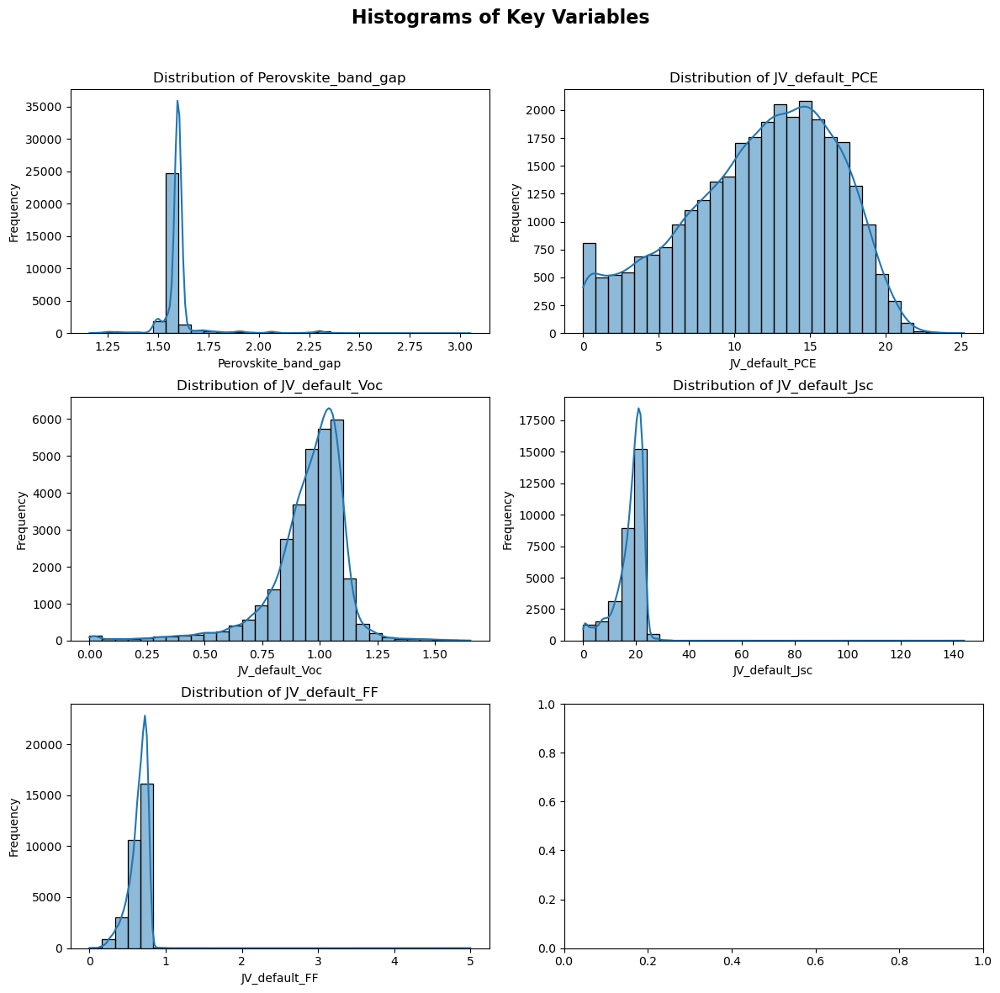

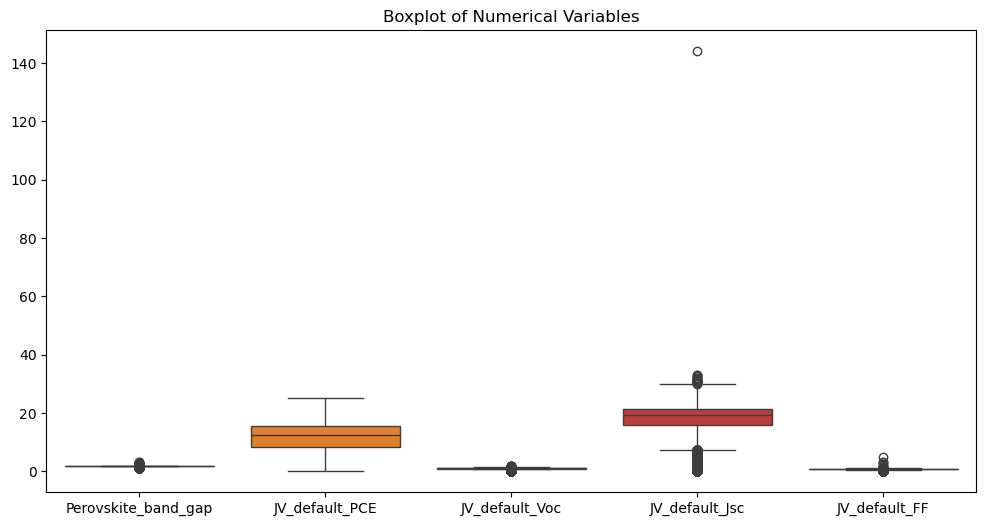

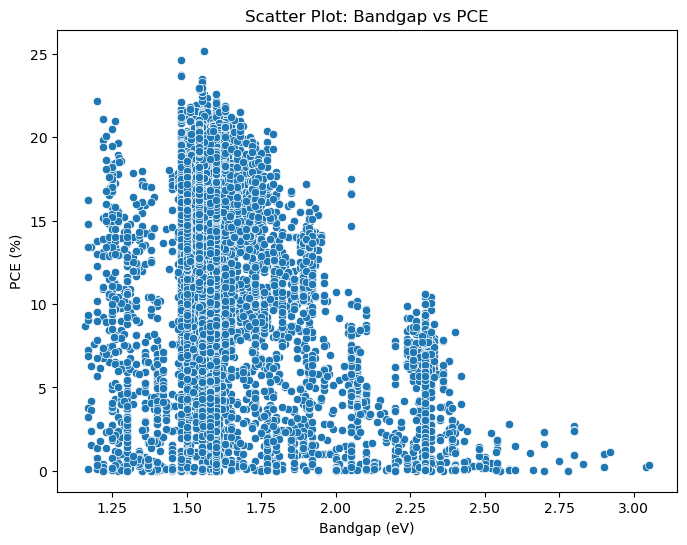

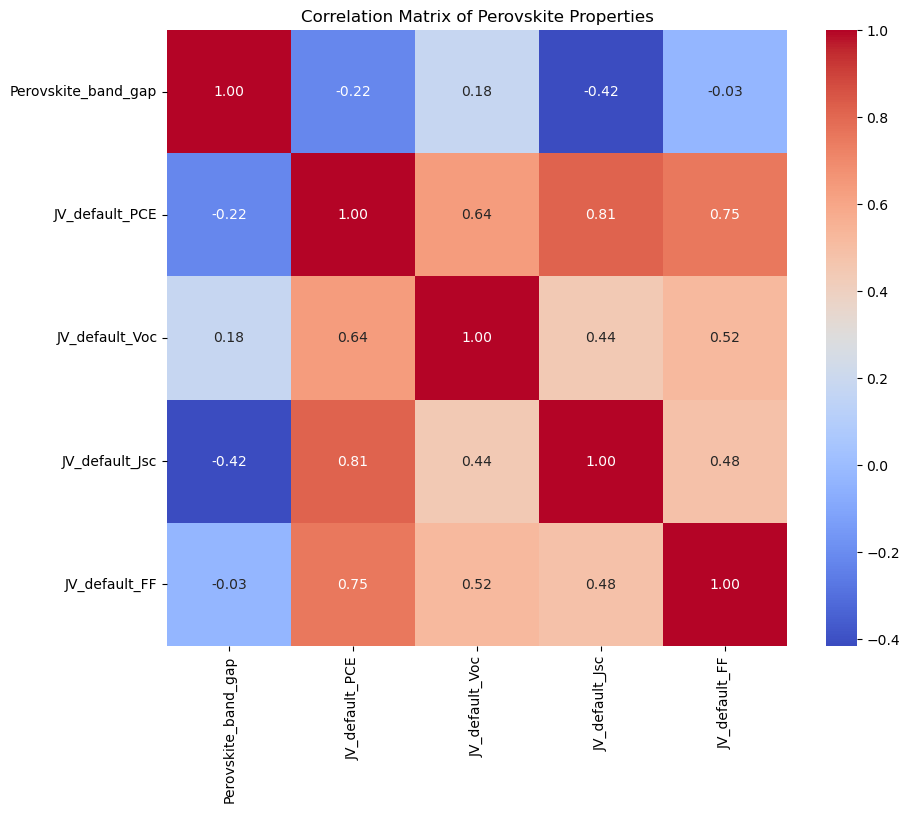

In [2]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Load the cleaned perovskite dataset
file_path = 'perovsite_database_query.csv'
data_cleaned = pd.read_csv(file_path)

# Define the numerical columns of interest for analysis
numerical_columns = ['Perovskite_band_gap', 'JV_default_PCE', 'JV_default_Voc', 'JV_default_Jsc', 'JV_default_FF']

# Reduce the dataset to only the columns required for analysis to reduce memory usage
data_reduced = data_cleaned[numerical_columns].copy()

# Cleaning numerical columns in-place for reduced dataset to avoid memory issues
for col in numerical_columns:
    # Convert the column to numeric, replacing invalid entries with NaN
    data_reduced[col] = pd.to_numeric(data_reduced[col], errors='coerce')

# Drop rows with NaN values in the key numerical columns after cleaning
data_reduced.dropna(inplace=True)

# Step 1: Univariate Analysis (after reducing and cleaning)
# Creating histograms for numerical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Histograms of Key Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), numerical_columns):
    sns.histplot(data_reduced[col], bins=30, ax=ax, kde=True)
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Adjust layout and display histograms
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 2: Box plots for numerical columns to identify outliers (after cleaning)
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=data_reduced[numerical_columns])
plt.title('Boxplot of Numerical Variables')
plt.show()

# Step 3: Bivariate Analysis (after cleaning)
# Scatter plot between Bandgap and PCE
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', data=data_reduced)
plt.title('Scatter Plot: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 4: Correlation matrix and heatmap (after cleaning)
corr_matrix = data_reduced.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Perovskite Properties')
plt.show()

/var/folders/j3/pj3kpjws5gj32d8zrny204340000gn/T/ipykernel_40087/2207186188.py:12: DtypeWarning: Columns (10,22,29,31,32,35,36,40,44,45,46,48,51,54,65,84,89,90,93,98,99,100,105,108,115,118,122,123,125,130,134,138,142,143,144,146,149,152,163,166,167,171,172,173,175,178,181,192,194,225,271,272,273,277,304,315,321,325,330,331,335,336,342,348,369,371,373,374,376,380,384,387,403,405,407,409) have mixed types. Specify dtype option on import or set low_memory=False.
  data_cleaned = pd.read_csv(file_path)


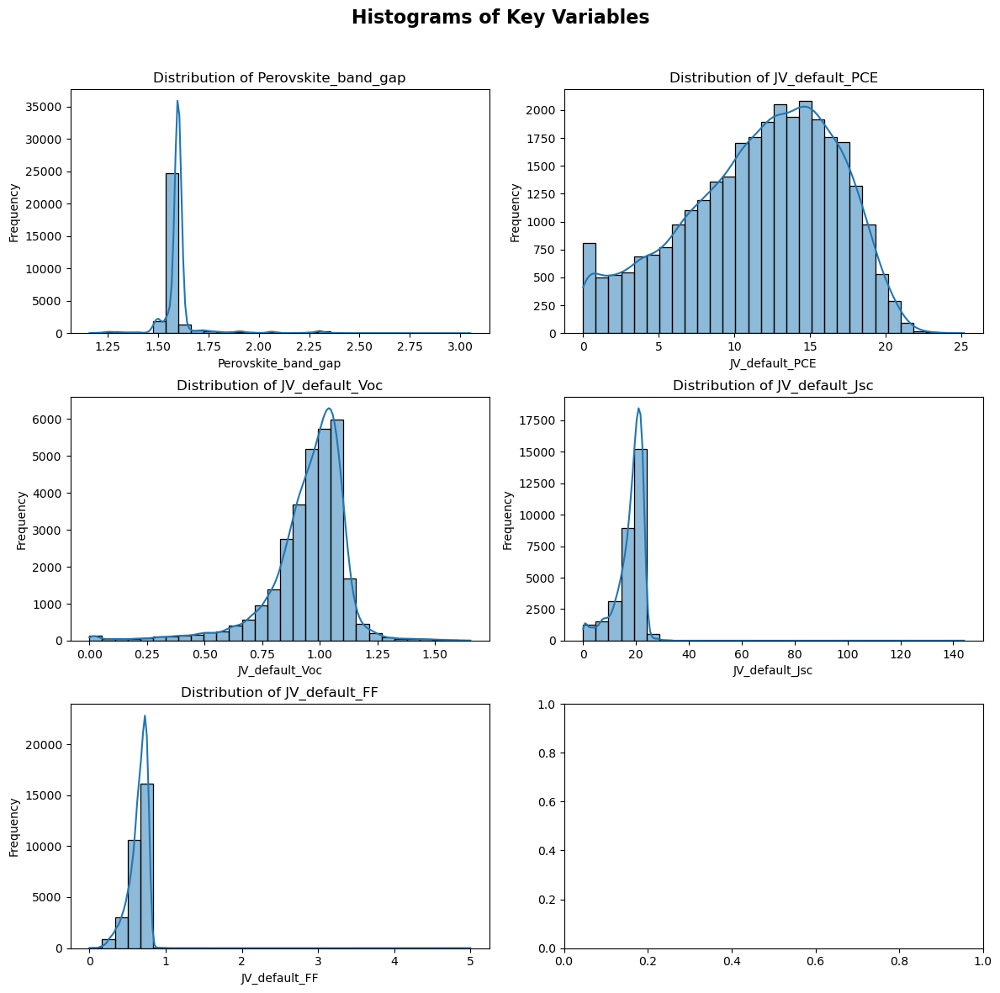

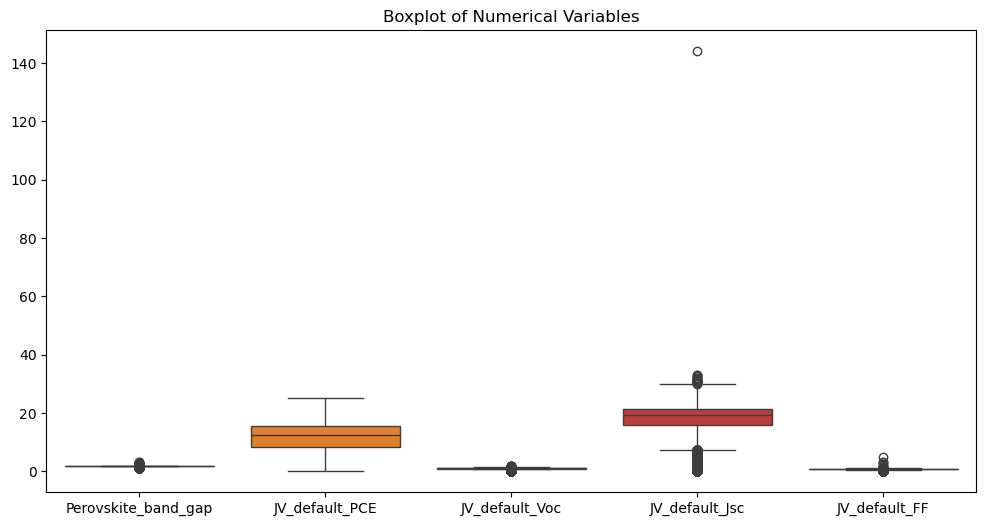

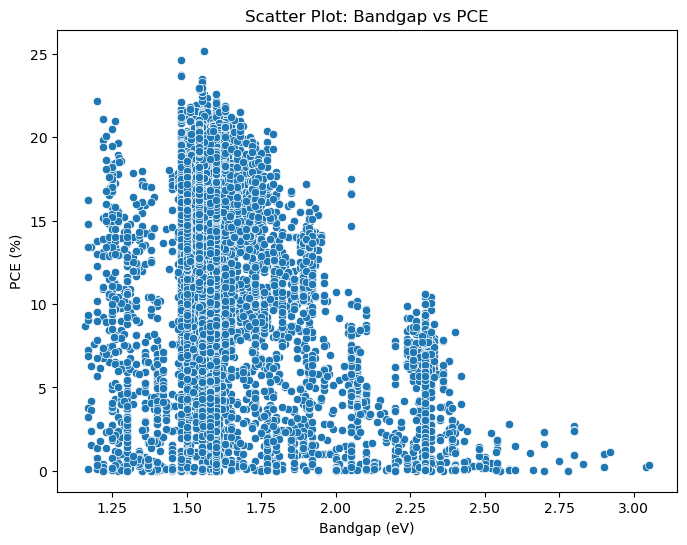

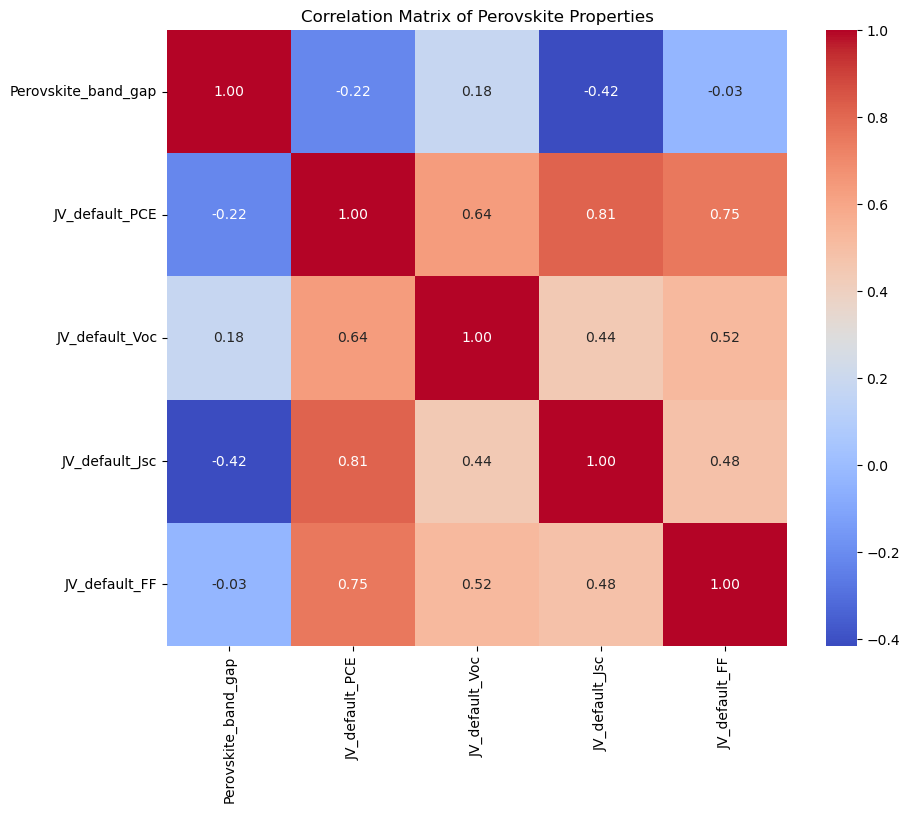


Advanced Correlation Analysis:

Pearson correlation between Perovskite_band_gap and JV_default_PCE: -0.22
Spearman correlation between Perovskite_band_gap and JV_default_PCE: -0.09

Pearson correlation between Perovskite_band_gap and JV_default_Voc: 0.18
Spearman correlation between Perovskite_band_gap and JV_default_Voc: 0.15

Pearson correlation between Perovskite_band_gap and JV_default_Jsc: -0.42
Spearman correlation between Perovskite_band_gap and JV_default_Jsc: -0.21

Pearson correlation between Perovskite_band_gap and JV_default_FF: -0.03
Spearman correlation between Perovskite_band_gap and JV_default_FF: 0.00

Pearson correlation between JV_default_PCE and JV_default_Voc: 0.64
Spearman correlation between JV_default_PCE and JV_default_Voc: 0.71

Pearson correlation between JV_default_PCE and JV_default_Jsc: 0.81
Spearman correlation between JV_default_PCE and JV_default_Jsc: 0.82

Pearson correlation between JV_default_PCE and JV_default_FF: 0.75
Spearman correlation between 

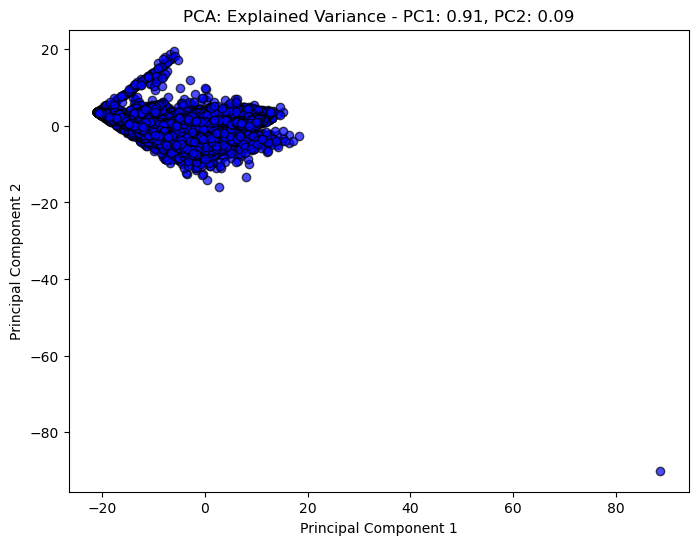

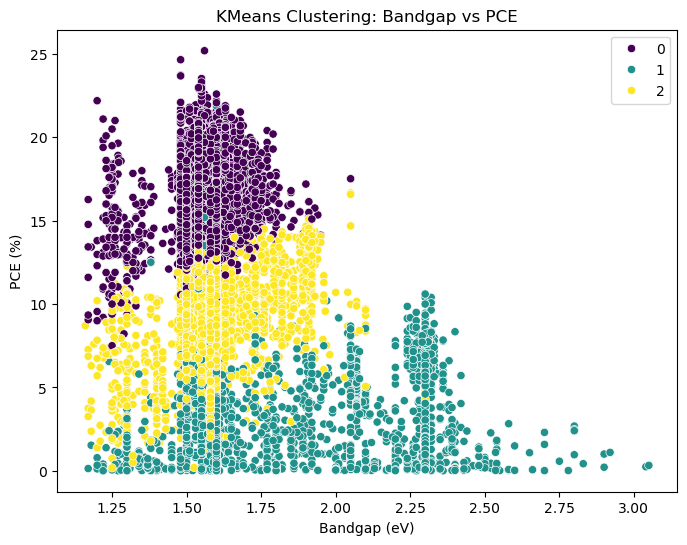

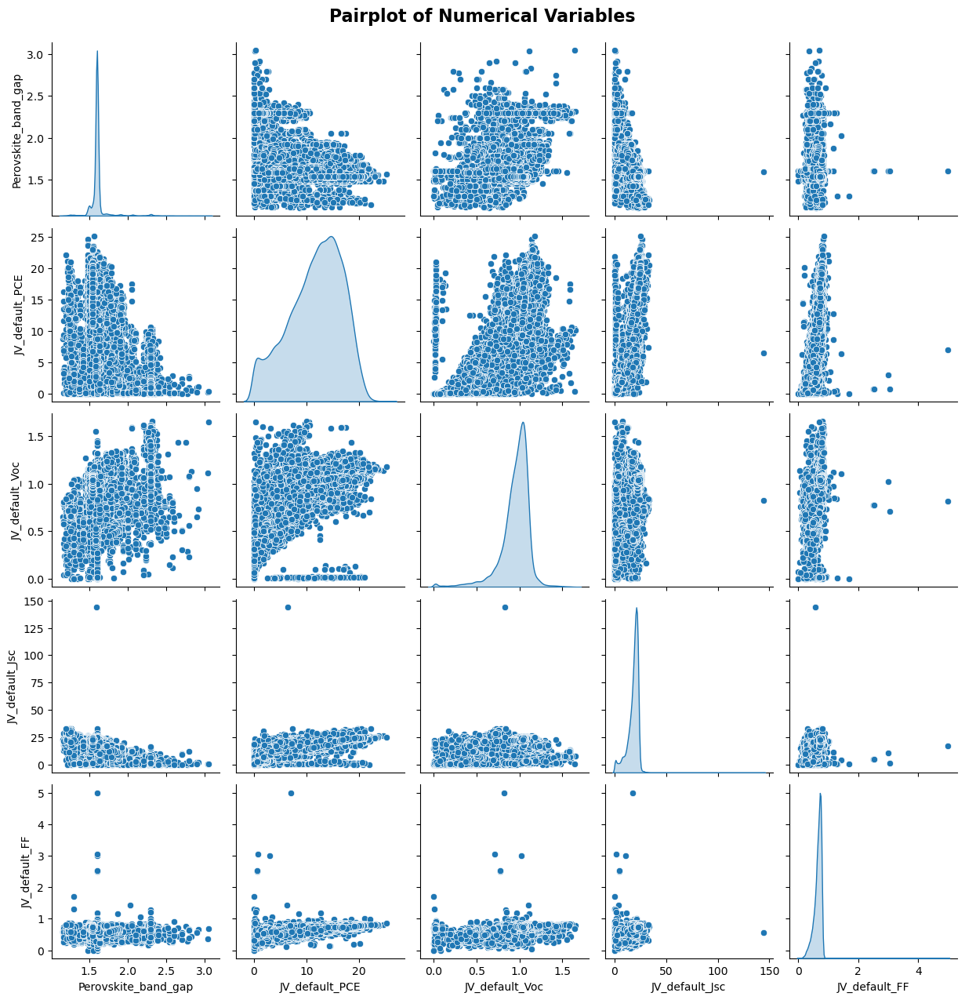

In [4]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Load the cleaned perovskite dataset
file_path = 'perovsite_database_query.csv'
data_cleaned = pd.read_csv(file_path)

# Define the numerical columns of interest for analysis
numerical_columns = ['Perovskite_band_gap', 'JV_default_PCE', 'JV_default_Voc', 'JV_default_Jsc', 'JV_default_FF']

# Reduce the dataset to only the columns required for analysis to reduce memory usage
data_reduced = data_cleaned[numerical_columns].copy()

# Cleaning numerical columns in-place for reduced dataset to avoid memory issues
for col in numerical_columns:
    # Convert the column to numeric, replacing invalid entries with NaN
    data_reduced[col] = pd.to_numeric(data_reduced[col], errors='coerce')

# Drop rows with NaN values in the key numerical columns after cleaning
data_reduced.dropna(inplace=True)

# Step 1: Univariate Analysis (after reducing and cleaning)
# Creating histograms for numerical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Histograms of Key Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), numerical_columns):
    sns.histplot(data_reduced[col], bins=30, ax=ax, kde=True)
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Adjust layout and display histograms
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 2: Box plots for numerical columns to identify outliers (after cleaning)
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=data_reduced[numerical_columns])
plt.title('Boxplot of Numerical Variables')
plt.show()

# Step 3: Bivariate Analysis (after cleaning)
# Scatter plot between Bandgap and PCE
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', data=data_reduced)
plt.title('Scatter Plot: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 4: Correlation matrix and heatmap (after cleaning)
corr_matrix = data_reduced.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Perovskite Properties')
plt.show()

# Step 5: Advanced Correlation Analysis
# Calculate Pearson and Spearman correlation coefficients for each pair of variables
print("\nAdvanced Correlation Analysis:\n")
for i in range(len(numerical_columns)):
    for j in range(i + 1, len(numerical_columns)):
        col1 = numerical_columns[i]
        col2 = numerical_columns[j]
        pearson_corr, _ = pearsonr(data_reduced[col1], data_reduced[col2])
        spearman_corr, _ = spearmanr(data_reduced[col1], data_reduced[col2])
        print(f"Pearson correlation between {col1} and {col2}: {pearson_corr:.2f}")
        print(f"Spearman correlation between {col1} and {col2}: {spearman_corr:.2f}\n")

# Step 6: Principal Component Analysis (PCA)
# Perform PCA to reduce dimensionality and understand the variance in the dataset
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_reduced)
explained_variance = pca.explained_variance_ratio_

plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c='blue', edgecolor='k', alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title(f'PCA: Explained Variance - PC1: {explained_variance[0]:.2f}, PC2: {explained_variance[1]:.2f}')
plt.show()

# Step 7: Clustering Analysis using KMeans
# Perform KMeans clustering to identify potential groups within the data
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(data_reduced)
labels = kmeans.labels_

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', hue=labels, palette='viridis', data=data_reduced, legend='full')
plt.title('KMeans Clustering: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 8: Pairplot for Multivariate Analysis
# Visualize pairwise relationships between all numerical variables
sns.pairplot(data_reduced, diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
plt.show()

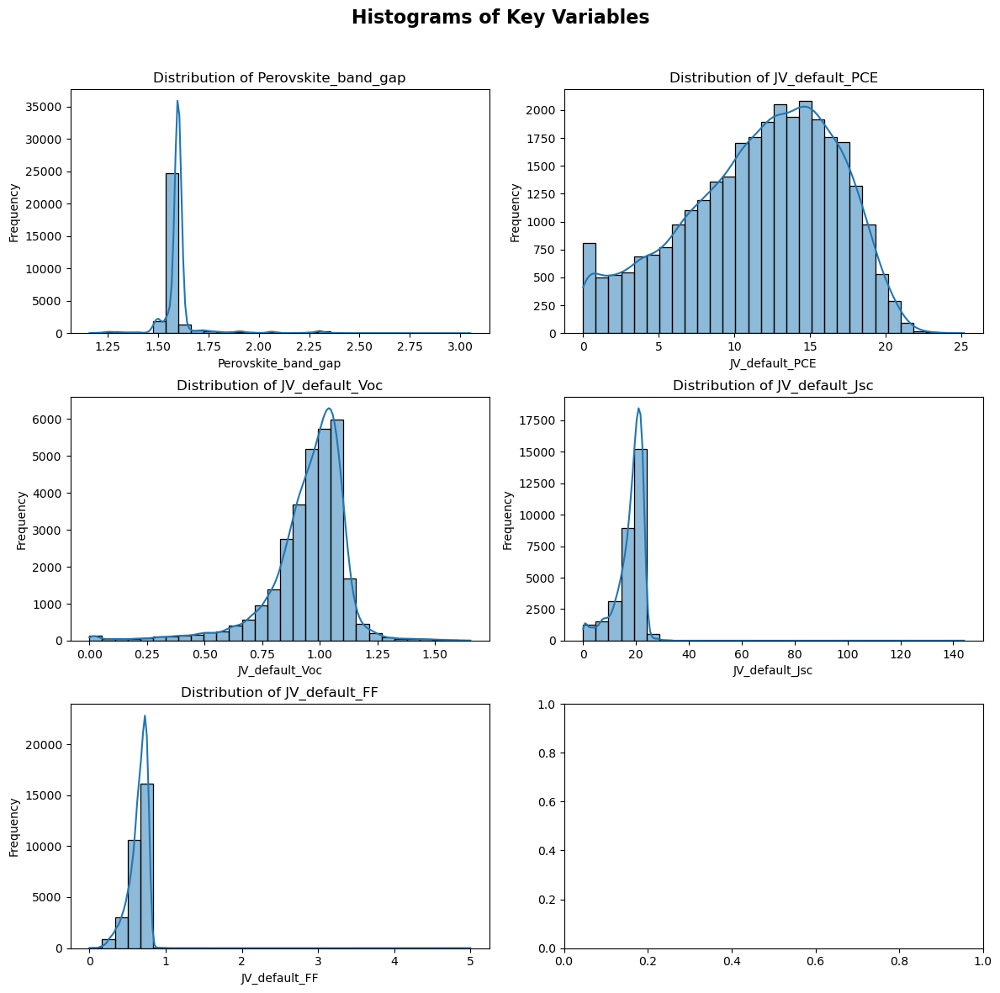

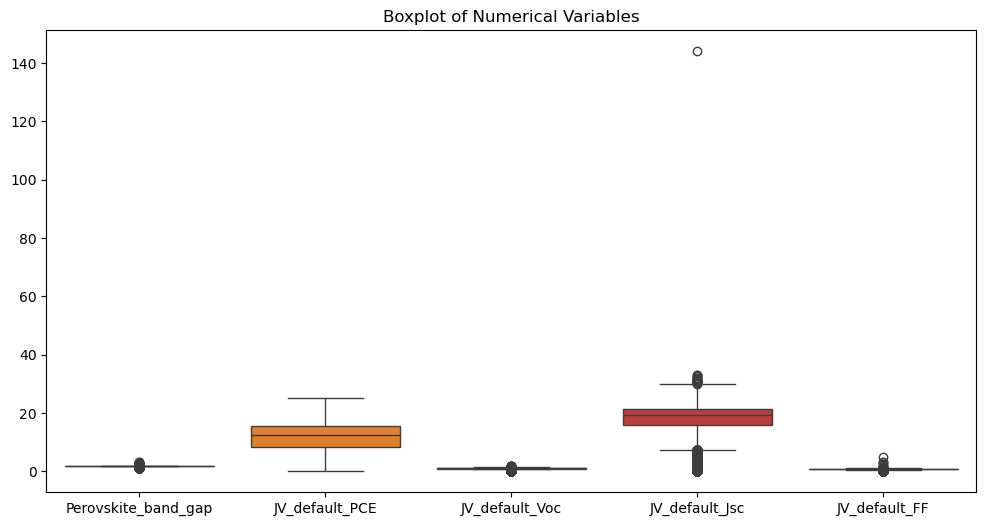

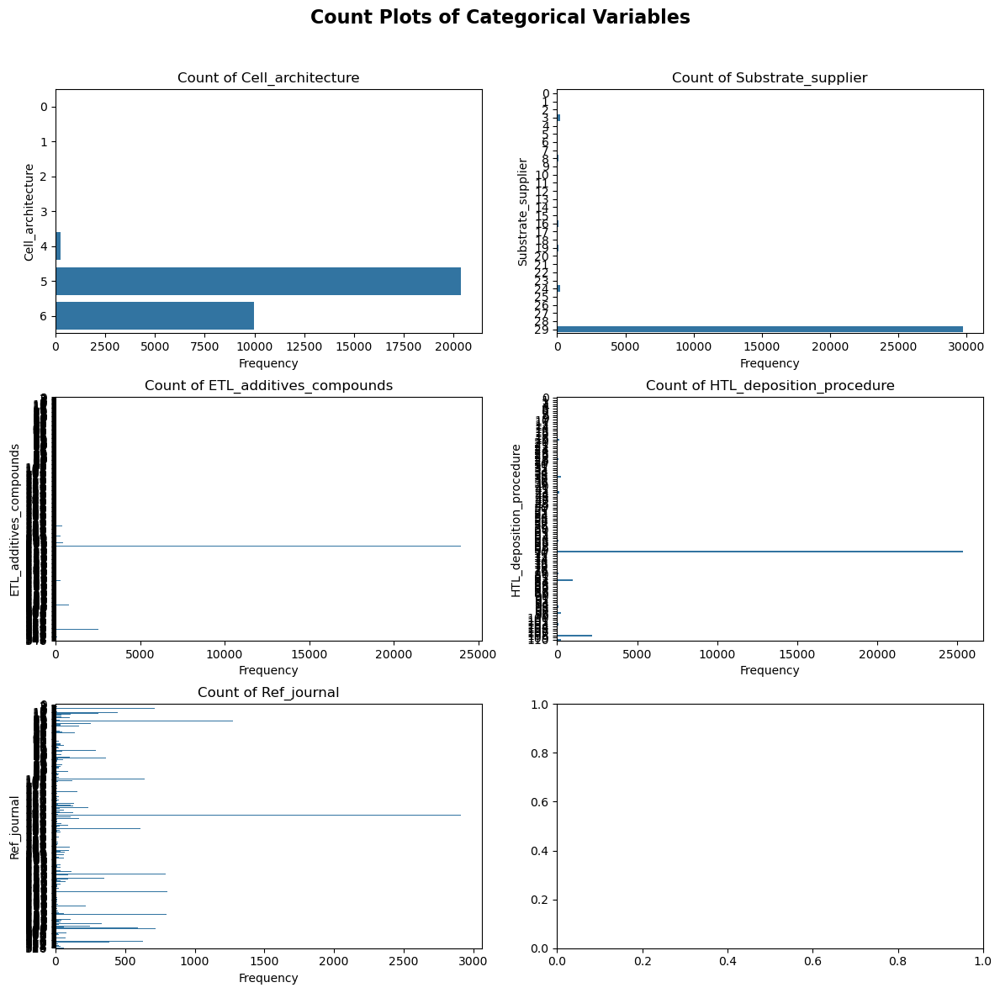

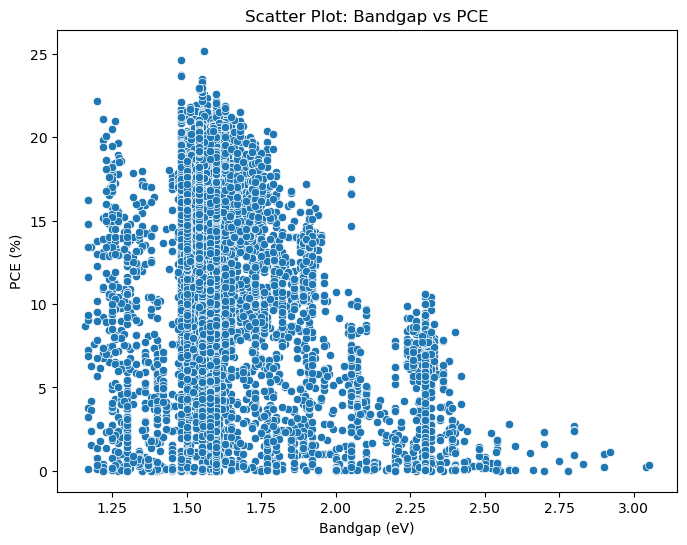

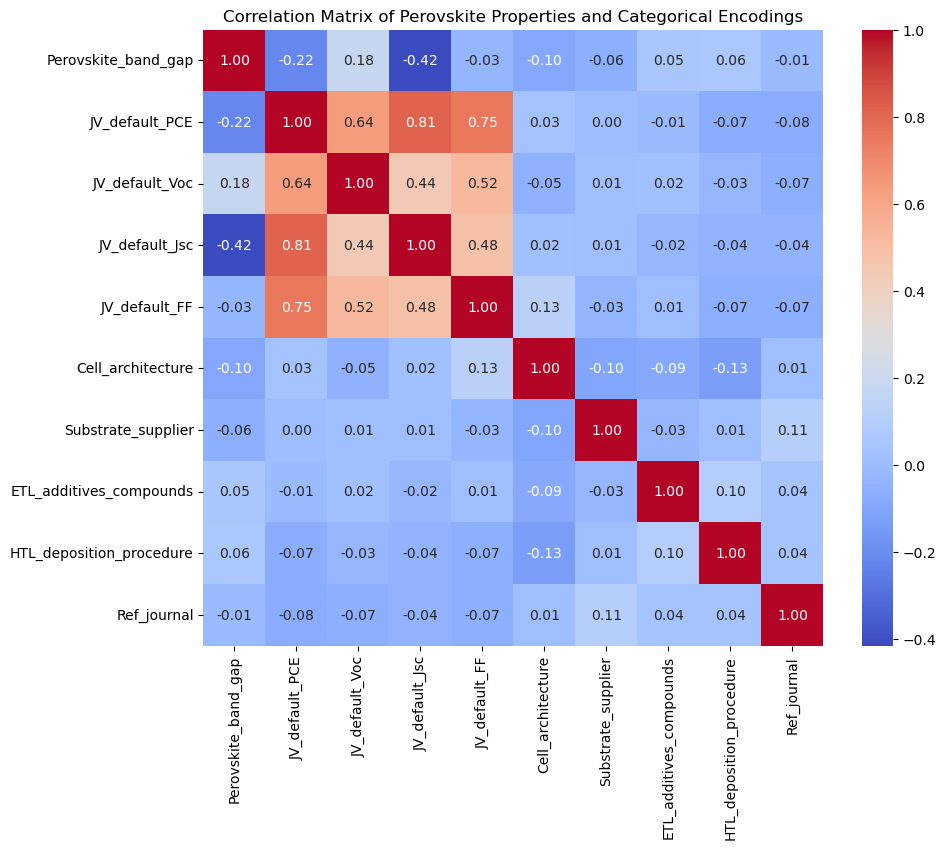


Advanced Correlation Analysis:

Pearson correlation between Perovskite_band_gap and JV_default_PCE: -0.22
Spearman correlation between Perovskite_band_gap and JV_default_PCE: -0.09

Pearson correlation between Perovskite_band_gap and JV_default_Voc: 0.18
Spearman correlation between Perovskite_band_gap and JV_default_Voc: 0.15

Pearson correlation between Perovskite_band_gap and JV_default_Jsc: -0.42
Spearman correlation between Perovskite_band_gap and JV_default_Jsc: -0.21

Pearson correlation between Perovskite_band_gap and JV_default_FF: -0.03
Spearman correlation between Perovskite_band_gap and JV_default_FF: 0.00

Pearson correlation between JV_default_PCE and JV_default_Voc: 0.64
Spearman correlation between JV_default_PCE and JV_default_Voc: 0.71

Pearson correlation between JV_default_PCE and JV_default_Jsc: 0.81
Spearman correlation between JV_default_PCE and JV_default_Jsc: 0.82

Pearson correlation between JV_default_PCE and JV_default_FF: 0.75
Spearman correlation between 

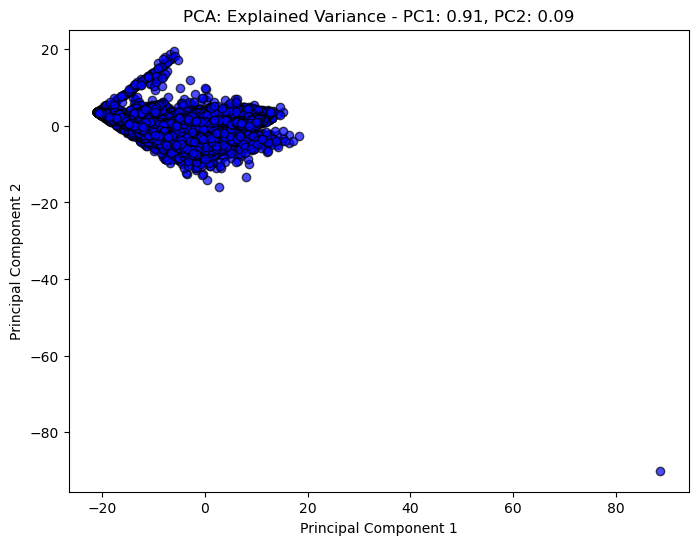

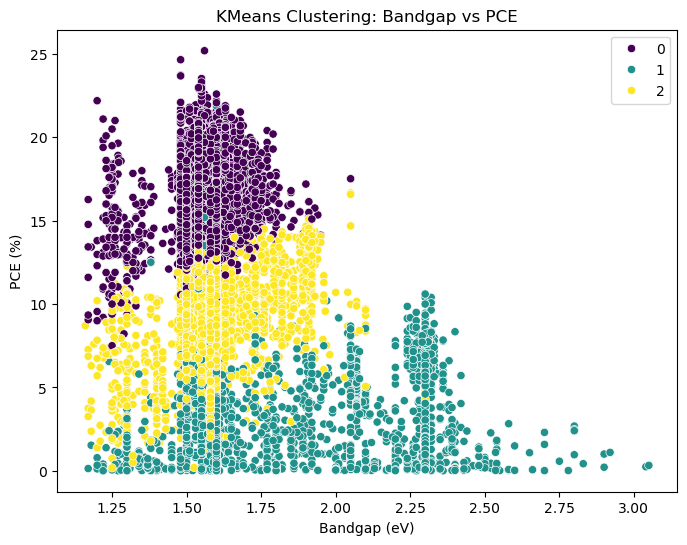

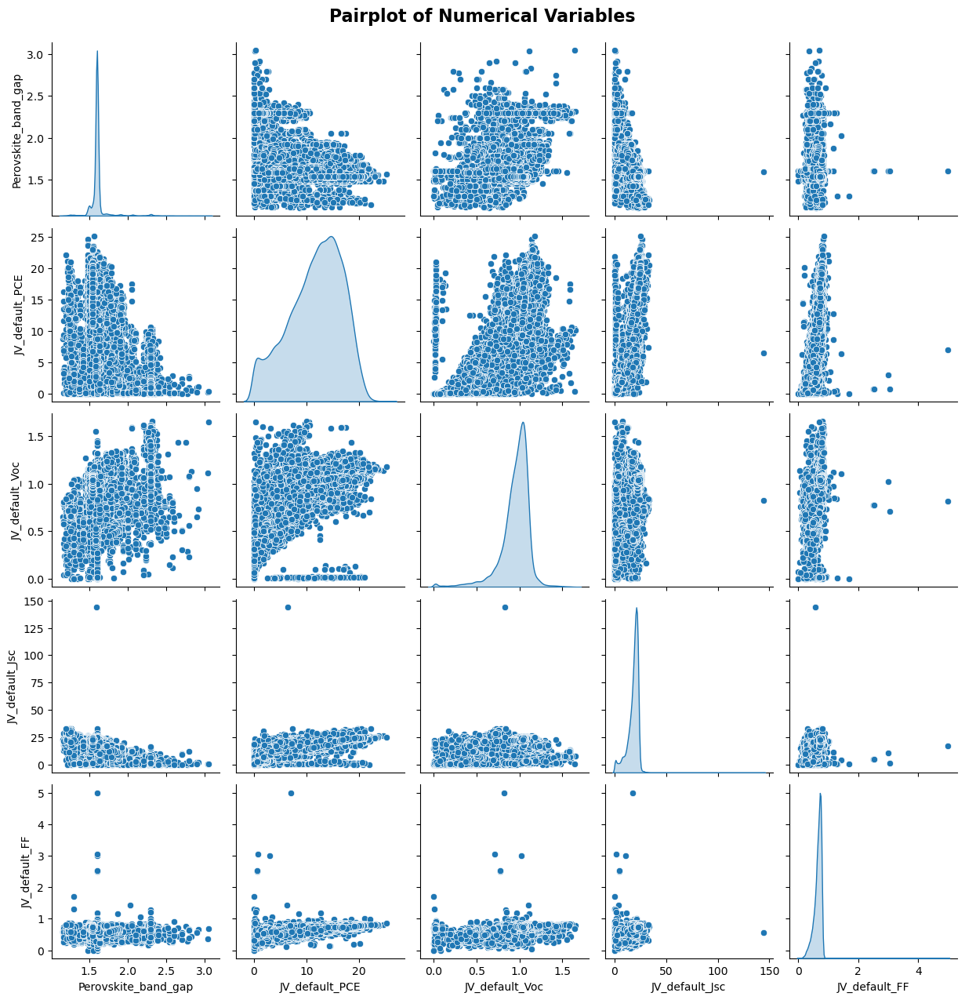

In [8]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
import datetime
from statsmodels.tsa.arima.model import ARIMA
import warnings

# Suppress warnings from statsmodels
warnings.filterwarnings('ignore')

# Load the cleaned perovskite dataset
file_path = 'perovsite_database_query.csv'
data_cleaned = pd.read_csv(file_path)

# Define numerical and categorical columns for analysis
numerical_columns = ['Perovskite_band_gap', 'JV_default_PCE', 'JV_default_Voc', 'JV_default_Jsc', 'JV_default_FF']
categorical_columns = ['Cell_architecture', 'Substrate_supplier', 'ETL_additives_compounds', 'HTL_deposition_procedure', 'Ref_journal']

# Step 1: Data Cleaning
# Reduce the dataset to only the columns required for analysis to reduce memory usage
data_reduced = data_cleaned[numerical_columns + categorical_columns].copy()

# Cleaning numerical columns in-place for reduced dataset to avoid memory issues
for col in numerical_columns:
    # Convert the column to numeric, replacing invalid entries with NaN
    data_reduced[col] = pd.to_numeric(data_reduced[col], errors='coerce')

# Drop rows with NaN values in the key numerical columns after cleaning
data_reduced.dropna(subset=numerical_columns, inplace=True)

# Step 2: Categorical Data Encoding
# Encode categorical variables using Label Encoding
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    data_reduced[col] = le.fit_transform(data_reduced[col].astype(str))
    label_encoders[col] = le

# Step 3: Univariate Analysis
# Creating histograms for numerical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Histograms of Key Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), numerical_columns):
    sns.histplot(data_reduced[col], bins=30, ax=ax, kde=True)
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Adjust layout and display histograms
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 4: Box plots for numerical columns to identify outliers
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=data_reduced[numerical_columns])
plt.title('Boxplot of Numerical Variables')
plt.show()

# Step 5: Categorical Data Analysis
# Count plots for categorical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Count Plots of Categorical Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), categorical_columns):
    sns.countplot(y=data_reduced[col], ax=ax)
    ax.set_title(f'Count of {col}')
    ax.set_ylabel(col)
    ax.set_xlabel('Frequency')

# Adjust layout and display count plots
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 6: Bivariate Analysis
# Scatter plot between Bandgap and PCE
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', data=data_reduced)
plt.title('Scatter Plot: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 7: Correlation matrix and heatmap
corr_matrix = data_reduced.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Perovskite Properties and Categorical Encodings')
plt.show()

# Step 8: Advanced Correlation Analysis
# Calculate Pearson and Spearman correlation coefficients for each pair of numerical variables
print("\nAdvanced Correlation Analysis:\n")
for i in range(len(numerical_columns)):
    for j in range(i + 1, len(numerical_columns)):
        col1 = numerical_columns[i]
        col2 = numerical_columns[j]
        pearson_corr, _ = pearsonr(data_reduced[col1], data_reduced[col2])
        spearman_corr, _ = spearmanr(data_reduced[col1], data_reduced[col2])
        print(f"Pearson correlation between {col1} and {col2}: {pearson_corr:.2f}")
        print(f"Spearman correlation between {col1} and {col2}: {spearman_corr:.2f}\n")

# Step 9: Principal Component Analysis (PCA)
# Perform PCA to reduce dimensionality and understand the variance in the dataset
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_reduced[numerical_columns])
explained_variance = pca.explained_variance_ratio_

plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c='blue', edgecolor='k', alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title(f'PCA: Explained Variance - PC1: {explained_variance[0]:.2f}, PC2: {explained_variance[1]:.2f}')
plt.show()

# Step 10: Clustering Analysis using KMeans
# Perform KMeans clustering to identify potential groups within the data
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(data_reduced[numerical_columns])
labels = kmeans.labels_

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', hue=labels, palette='viridis', data=data_reduced, legend='full')
plt.title('KMeans Clustering: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 11: Pairplot for Multivariate Analysis
# Visualize pairwise relationships between all numerical variables
sns.pairplot(data_reduced[numerical_columns], diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
plt.show()


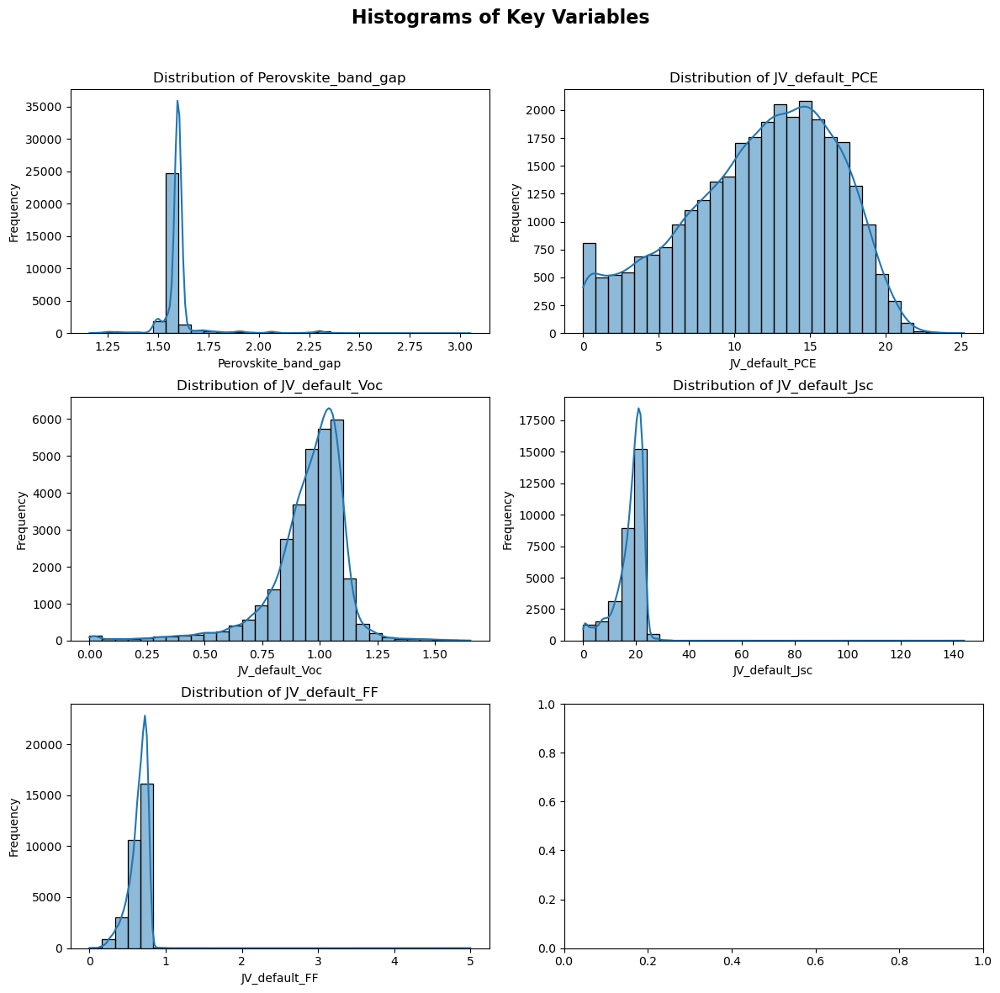

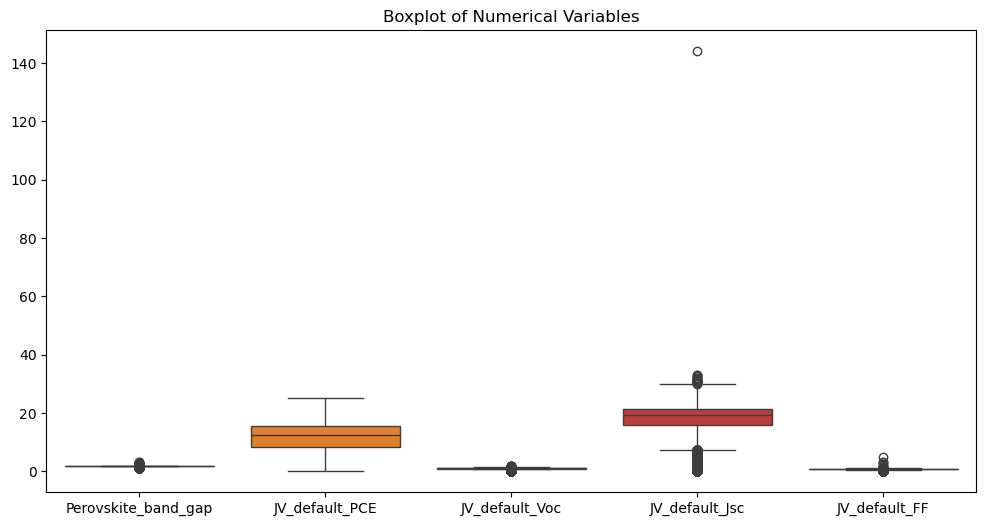

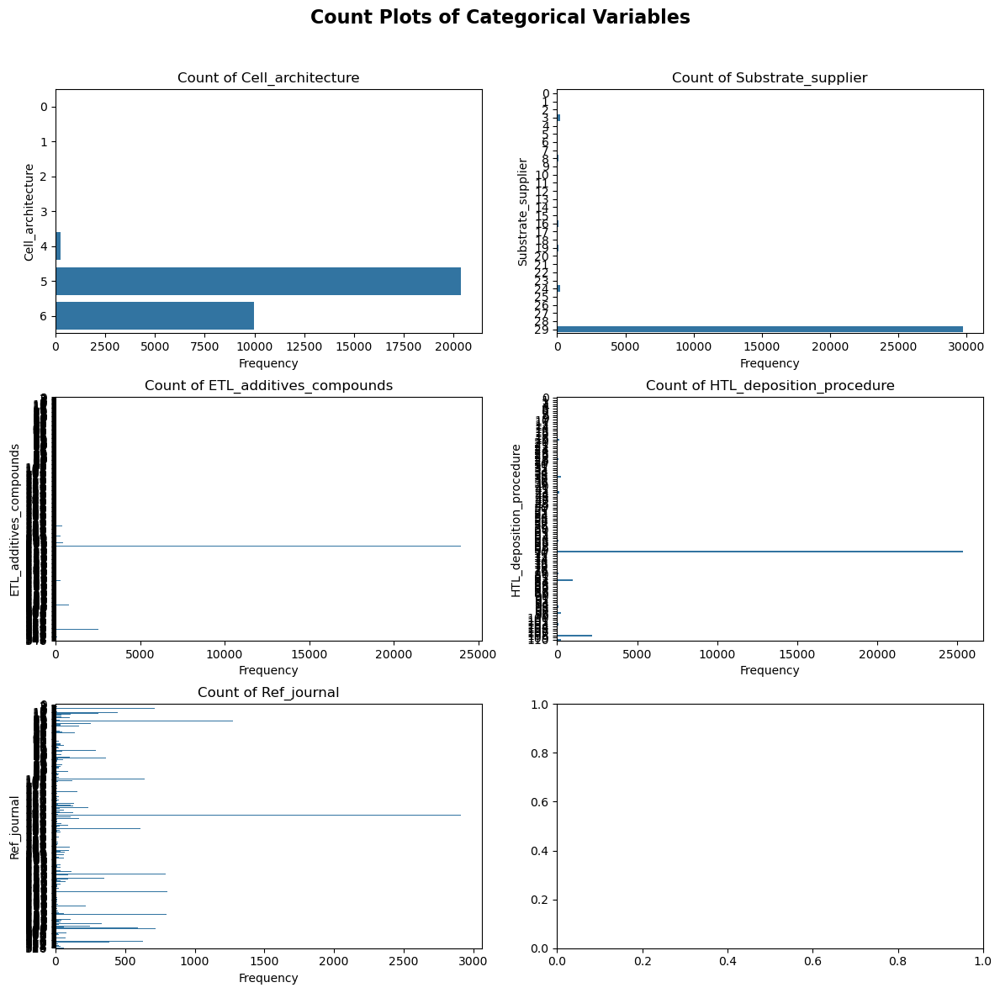

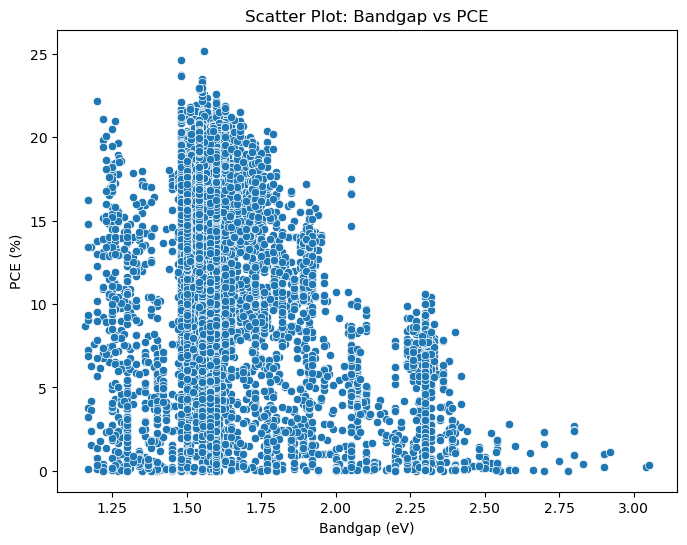

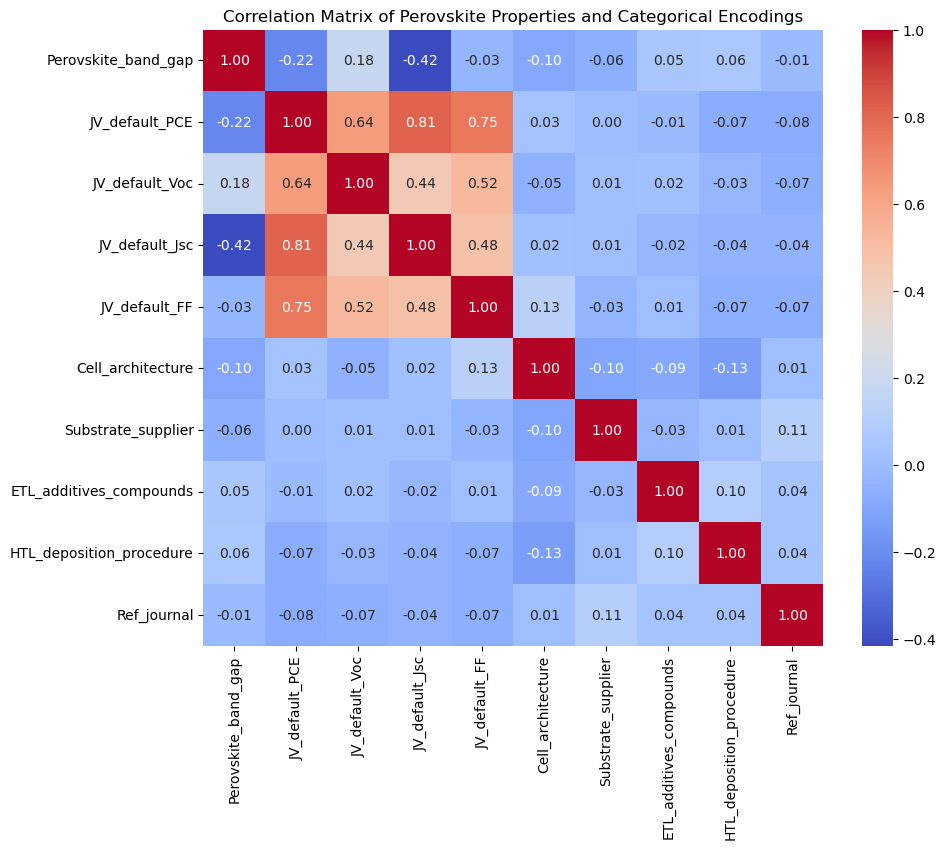


Advanced Correlation Analysis:

Pearson correlation between Perovskite_band_gap and JV_default_PCE: -0.22
Spearman correlation between Perovskite_band_gap and JV_default_PCE: -0.09

Pearson correlation between Perovskite_band_gap and JV_default_Voc: 0.18
Spearman correlation between Perovskite_band_gap and JV_default_Voc: 0.15

Pearson correlation between Perovskite_band_gap and JV_default_Jsc: -0.42
Spearman correlation between Perovskite_band_gap and JV_default_Jsc: -0.21

Pearson correlation between Perovskite_band_gap and JV_default_FF: -0.03
Spearman correlation between Perovskite_band_gap and JV_default_FF: 0.00

Pearson correlation between JV_default_PCE and JV_default_Voc: 0.64
Spearman correlation between JV_default_PCE and JV_default_Voc: 0.71

Pearson correlation between JV_default_PCE and JV_default_Jsc: 0.81
Spearman correlation between JV_default_PCE and JV_default_Jsc: 0.82

Pearson correlation between JV_default_PCE and JV_default_FF: 0.75
Spearman correlation between 

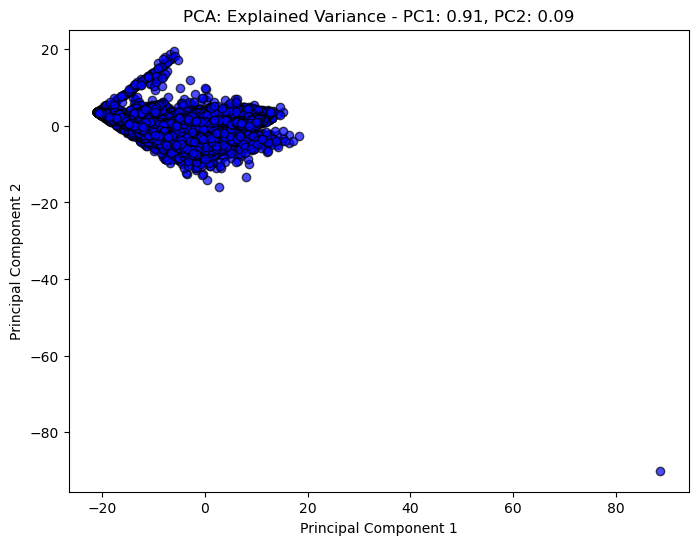

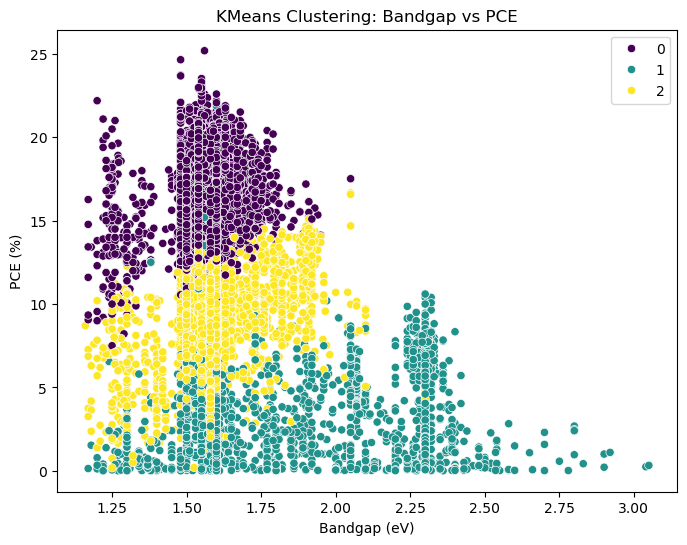

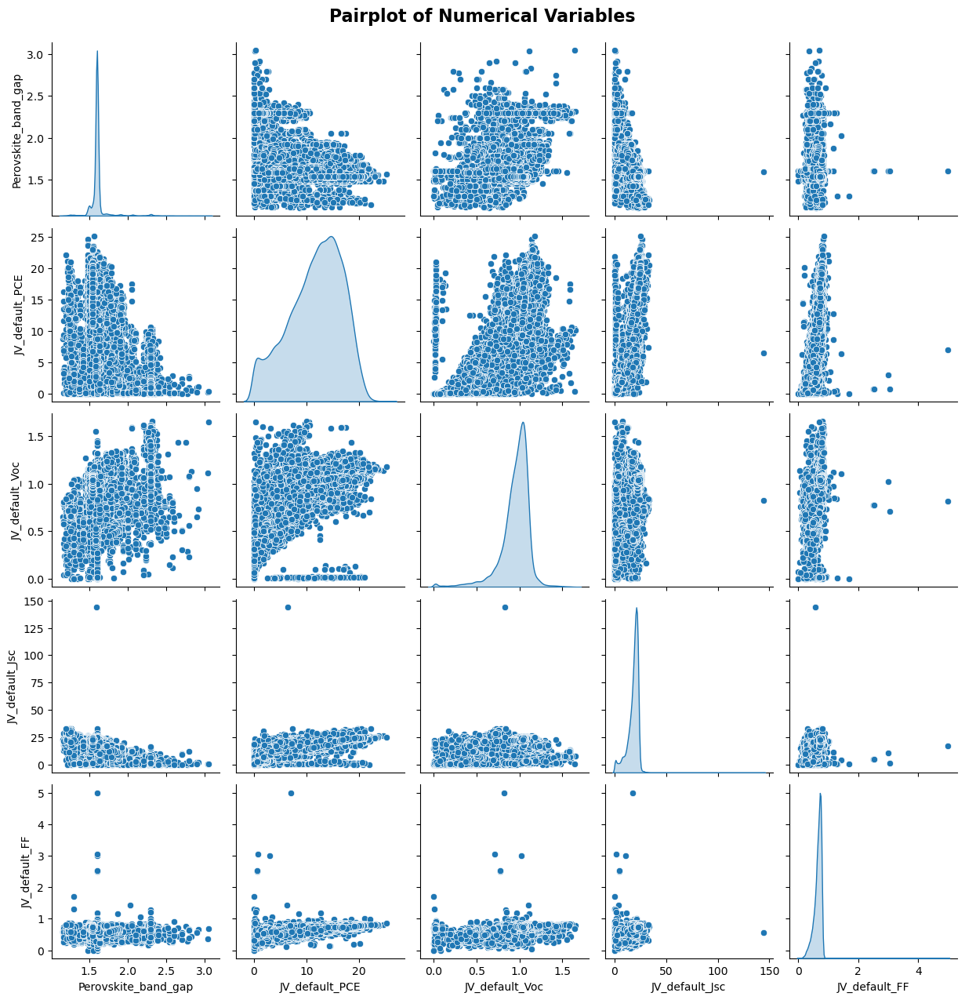

TypeError: agg function failed [how->mean,dtype->object]

In [10]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
import datetime
from statsmodels.tsa.arima.model import ARIMA
import warnings

# Suppress warnings from statsmodels
warnings.filterwarnings('ignore')

# Load the cleaned perovskite dataset
file_path = 'perovsite_database_query.csv'
data_cleaned = pd.read_csv(file_path)

# Define numerical and categorical columns for analysis
numerical_columns = ['Perovskite_band_gap', 'JV_default_PCE', 'JV_default_Voc', 'JV_default_Jsc', 'JV_default_FF']
categorical_columns = ['Cell_architecture', 'Substrate_supplier', 'ETL_additives_compounds', 'HTL_deposition_procedure', 'Ref_journal']

# Step 1: Data Cleaning
# Reduce the dataset to only the columns required for analysis to reduce memory usage
data_reduced = data_cleaned[numerical_columns + categorical_columns].copy()

# Cleaning numerical columns in-place for reduced dataset to avoid memory issues
for col in numerical_columns:
    # Convert the column to numeric, replacing invalid entries with NaN
    data_reduced[col] = pd.to_numeric(data_reduced[col], errors='coerce')

# Drop rows with NaN values in the key numerical columns after cleaning
data_reduced.dropna(subset=numerical_columns, inplace=True)

# Step 2: Categorical Data Encoding
# Encode categorical variables using Label Encoding
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    data_reduced[col] = le.fit_transform(data_reduced[col].astype(str))
    label_encoders[col] = le

# Step 3: Univariate Analysis
# Creating histograms for numerical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Histograms of Key Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), numerical_columns):
    sns.histplot(data_reduced[col], bins=30, ax=ax, kde=True)
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Adjust layout and display histograms
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 4: Box plots for numerical columns to identify outliers
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=data_reduced[numerical_columns])
plt.title('Boxplot of Numerical Variables')
plt.show()

# Step 5: Categorical Data Analysis
# Count plots for categorical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Count Plots of Categorical Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), categorical_columns):
    sns.countplot(y=data_reduced[col], ax=ax)
    ax.set_title(f'Count of {col}')
    ax.set_ylabel(col)
    ax.set_xlabel('Frequency')

# Adjust layout and display count plots
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 6: Bivariate Analysis
# Scatter plot between Bandgap and PCE
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', data=data_reduced)
plt.title('Scatter Plot: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 7: Correlation matrix and heatmap
corr_matrix = data_reduced.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Perovskite Properties and Categorical Encodings')
plt.show()

# Step 8: Advanced Correlation Analysis
# Calculate Pearson and Spearman correlation coefficients for each pair of numerical variables
print("\nAdvanced Correlation Analysis:\n")
for i in range(len(numerical_columns)):
    for j in range(i + 1, len(numerical_columns)):
        col1 = numerical_columns[i]
        col2 = numerical_columns[j]
        pearson_corr, _ = pearsonr(data_reduced[col1], data_reduced[col2])
        spearman_corr, _ = spearmanr(data_reduced[col1], data_reduced[col2])
        print(f"Pearson correlation between {col1} and {col2}: {pearson_corr:.2f}")
        print(f"Spearman correlation between {col1} and {col2}: {spearman_corr:.2f}\n")

# Step 9: Principal Component Analysis (PCA)
# Perform PCA to reduce dimensionality and understand the variance in the dataset
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_reduced[numerical_columns])
explained_variance = pca.explained_variance_ratio_

plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c='blue', edgecolor='k', alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title(f'PCA: Explained Variance - PC1: {explained_variance[0]:.2f}, PC2: {explained_variance[1]:.2f}')
plt.show()

# Step 10: Clustering Analysis using KMeans
# Perform KMeans clustering to identify potential groups within the data
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(data_reduced[numerical_columns])
labels = kmeans.labels_

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', hue=labels, palette='viridis', data=data_reduced, legend='full')
plt.title('KMeans Clustering: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 11: Pairplot for Multivariate Analysis
# Visualize pairwise relationships between all numerical variables
sns.pairplot(data_reduced[numerical_columns], diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
plt.show()

# Step 12: Time Series Analysis (if possible)
# Check if there is a time-related column in the dataset
if 'Ref_publication_date' in data_cleaned.columns:
    # Convert the date column to datetime format
    data_cleaned['Ref_publication_date'] = pd.to_datetime(data_cleaned['Ref_publication_date'], errors='coerce')
    
    # Drop rows with NaT values in the date column
    data_cleaned.dropna(subset=['Ref_publication_date'], inplace=True)
    
    # Set the date column as the index for time series analysis
    data_time_series = data_cleaned.set_index('Ref_publication_date')
    
    # Resample data by year and calculate the mean of numerical columns
    yearly_data = data_time_series[numerical_columns].resample('Y').mean()
    
    # Plot time series of key variables
    plt.figure(figsize=(10, 6))
    for col in numerical_columns:
        plt.plot(yearly_data.index, yearly_data[col], label=col)
    plt.xlabel('Year')
    plt.ylabel('Mean Value')
    plt.title('Time Series Analysis of Key Variables (Yearly Mean)')
    plt.legend()
    plt.show()

    # Step 13: ARIMA Model for Trend Analysis
    # Apply ARIMA model to the yearly data for PCE to understand the trend
    pce_data = yearly_data['JV_default_PCE'].dropna()
    if len(pce_data) > 2:  # ARIMA requires at least 3 data points
        model = ARIMA(pce_data, order=(1, 1, 1))
        model_fit = model.fit()
        
        # Plot the original data and the fitted values
        plt.figure(figsize=(10, 6))
        plt.plot(pce_data.index, pce_data, label='Original PCE Data')
        plt.plot(pce_data.index, model_fit.fittedvalues, color='red', label='ARIMA Fitted Values')
        plt.xlabel('Year')
        plt.ylabel('PCE (%)')
        plt.title('ARIMA Model Fit for PCE Trend Analysis')
        plt.legend()
        plt.show()

        # Print ARIMA model summary
        print(model_fit.summary())

# Step 14: Impact of Publication and Researcher on Device Performance
# Group data by lead author and journal to observe average PCE
performance_by_author_journal = data_cleaned.groupby(['Ref_lead_author', 'Ref_journal'])['JV_default_PCE'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='JV_default_PCE', y='Ref_lead_author', data=performance_by_author_journal.sort_values(by='JV_default_PCE', ascending=False).head(10))
plt.title('Top 10 Lead Authors with Highest Average PCE')
plt.xlabel('Average PCE (%)')
plt.ylabel('Lead Author')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x='JV_default_PCE', y='Ref_journal', data=performance_by_author_journal.sort_values(by='JV_default_PCE', ascending=False).head(10))
plt.title('Top 10 Journals with Highest Average PCE')
plt.xlabel('Average PCE (%)')
plt.ylabel('Journal')
plt.show()

# Step 15: Fabrication Process vs. Solar Cell Efficiency
# Analyze which fabrication process yields higher efficiencies
data_fabrication = data_cleaned[['Cell_architecture', 'Substrate_deposition_procedure', 'JV_default_PCE']].dropna()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cell_architecture', y='JV_default_PCE', data=data_fabrication)
plt.title('Cell Architecture vs PCE')
plt.xlabel('Cell Architecture')
plt.ylabel('PCE (%)')
plt.xticks(rotation=45)
plt.show()

# Step 16: Effect of Transport Layer on Device Characteristics
# Analyze how ETL/HTL additives impact Voc and Jsc
etl_htl_effect = data_cleaned[['ETL_additives_compounds', 'HTL_additives_compounds', 'JV_default_Voc', 'JV_default_Jsc']].dropna()

plt.figure(figsize=(12, 6))
sns.boxplot(x='ETL_additives_compounds', y='JV_default_Voc', data=etl_htl_effect)
plt.title('ETL Additives vs Voc')
plt.xlabel('ETL Additives')
plt.ylabel('Voc (V)')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='HTL_additives_compounds', y='JV_default_Jsc', data=etl_htl_effect)
plt.title('HTL Additives vs Jsc')
plt.xlabel('HTL Additives')
plt.ylabel('Jsc (mA/cm^2)')
plt.xticks(rotation=45)
plt.show()

# Step 17: Material Composition and Efficiency
# Investigate which perovskite composition components contribute most to bandgap optimization and PCE
composition_effect = data_cleaned[['Perovskite_composition_a_ions', 'Perovskite_composition_b_ions', 'Perovskite_band_gap', 'JV_default_PCE']].dropna()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Perovskite_composition_a_ions', y='JV_default_PCE', data=composition_effect)
plt.title('Perovskite Composition A Ions vs PCE')
plt.xlabel('Composition A Ions')
plt.ylabel('PCE (%)')
plt.xticks(rotation=45)
plt.show

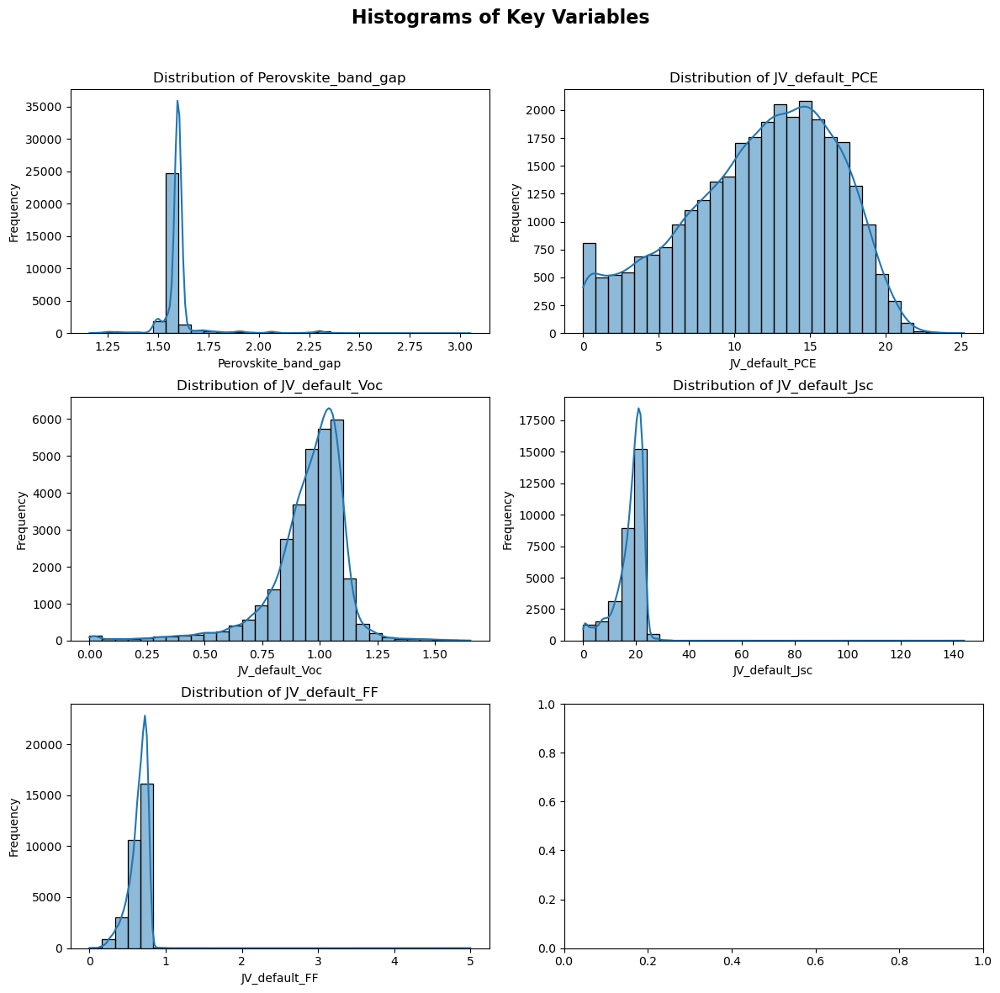

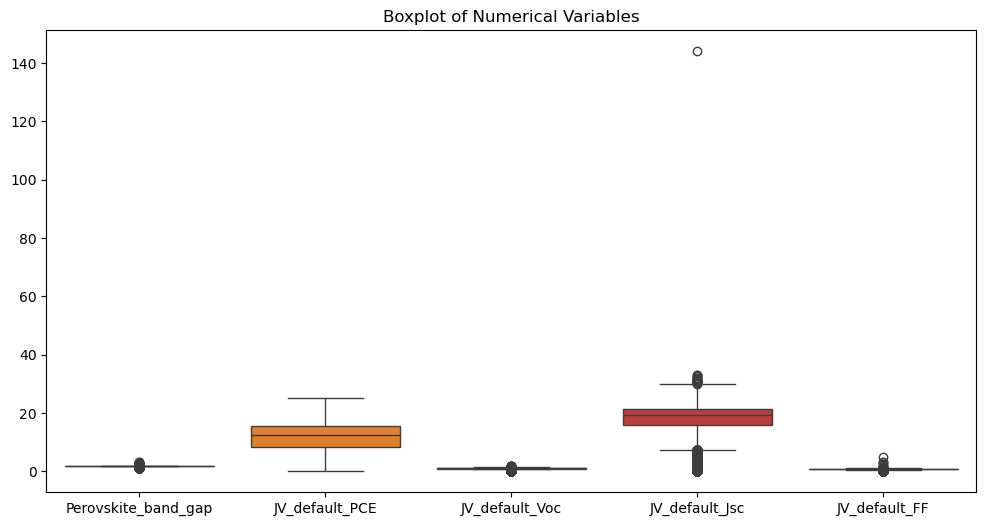

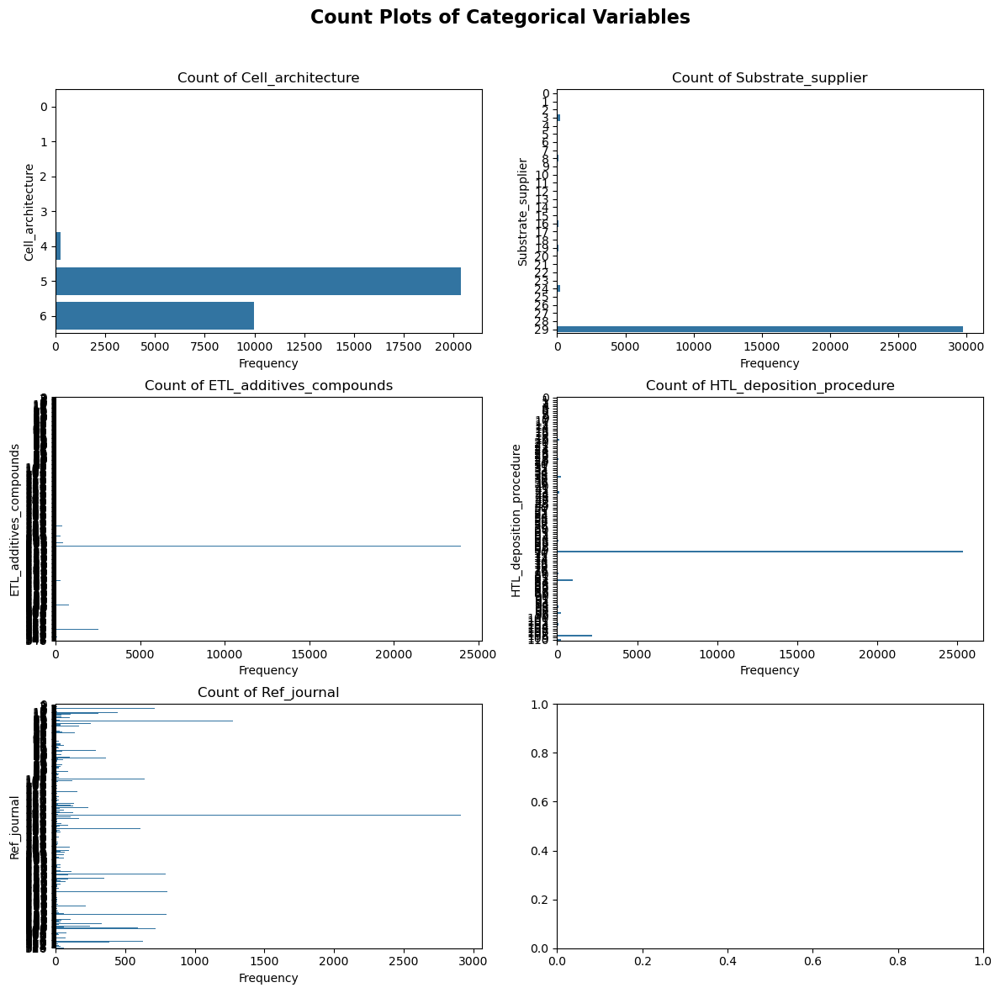

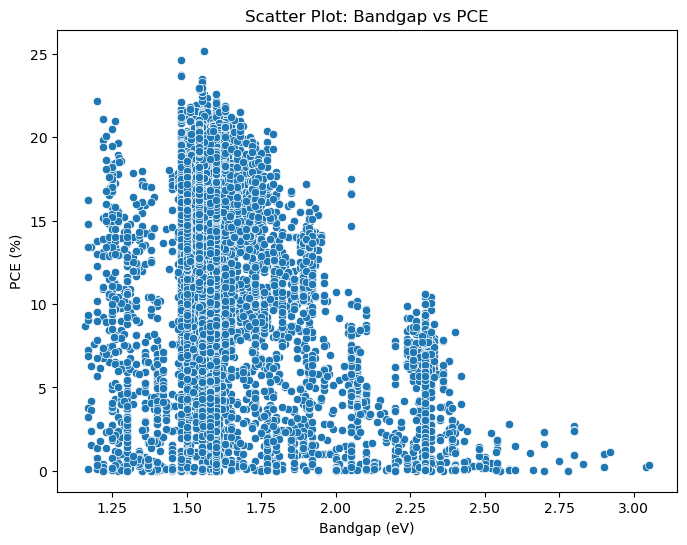

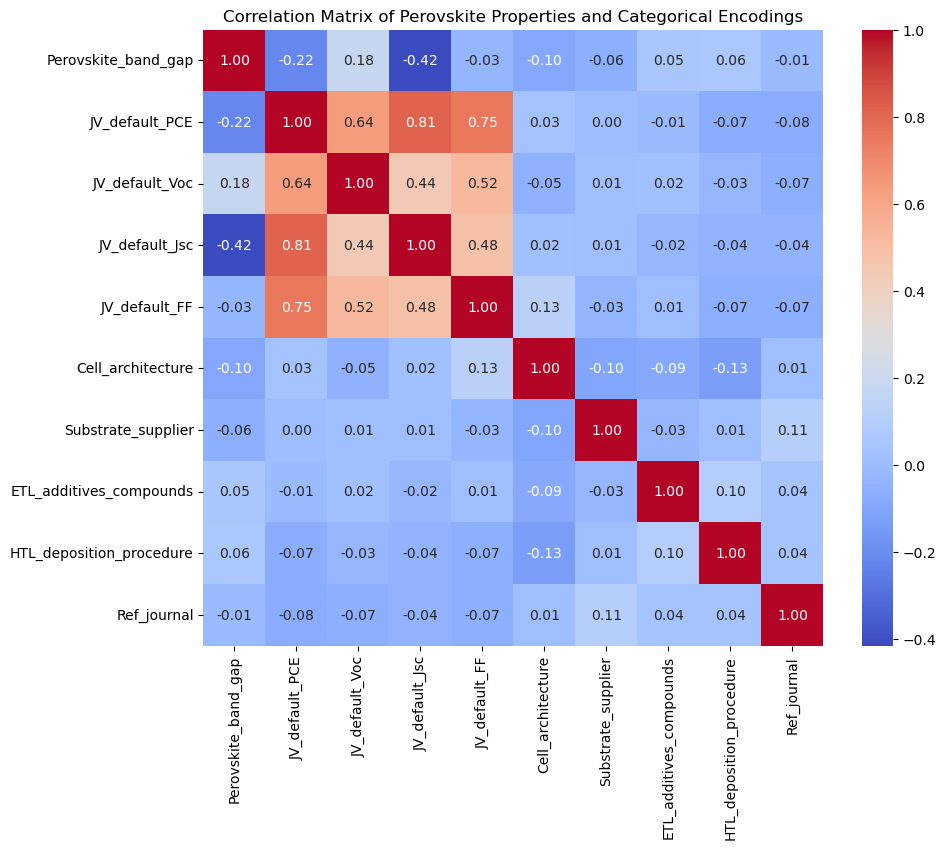


Advanced Correlation Analysis:

Pearson correlation between Perovskite_band_gap and JV_default_PCE: -0.22
Spearman correlation between Perovskite_band_gap and JV_default_PCE: -0.09

Pearson correlation between Perovskite_band_gap and JV_default_Voc: 0.18
Spearman correlation between Perovskite_band_gap and JV_default_Voc: 0.15

Pearson correlation between Perovskite_band_gap and JV_default_Jsc: -0.42
Spearman correlation between Perovskite_band_gap and JV_default_Jsc: -0.21

Pearson correlation between Perovskite_band_gap and JV_default_FF: -0.03
Spearman correlation between Perovskite_band_gap and JV_default_FF: 0.00

Pearson correlation between JV_default_PCE and JV_default_Voc: 0.64
Spearman correlation between JV_default_PCE and JV_default_Voc: 0.71

Pearson correlation between JV_default_PCE and JV_default_Jsc: 0.81
Spearman correlation between JV_default_PCE and JV_default_Jsc: 0.82

Pearson correlation between JV_default_PCE and JV_default_FF: 0.75
Spearman correlation between 

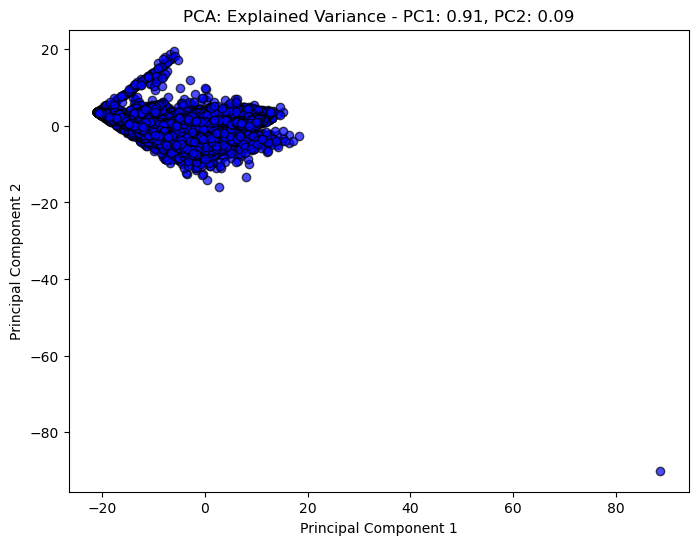

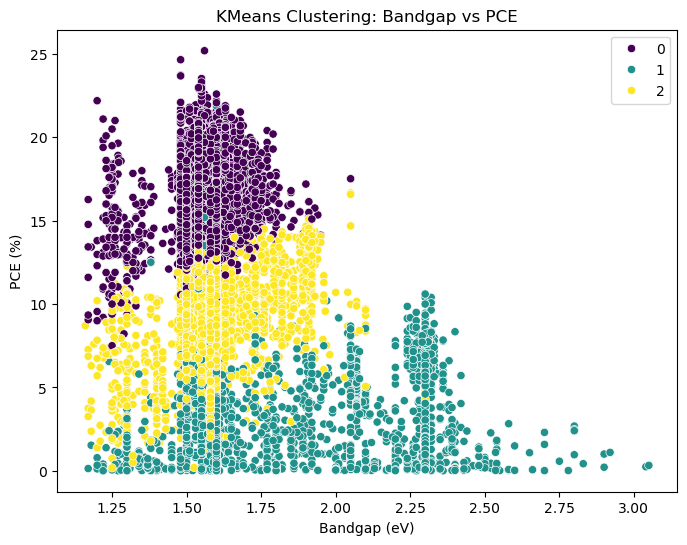

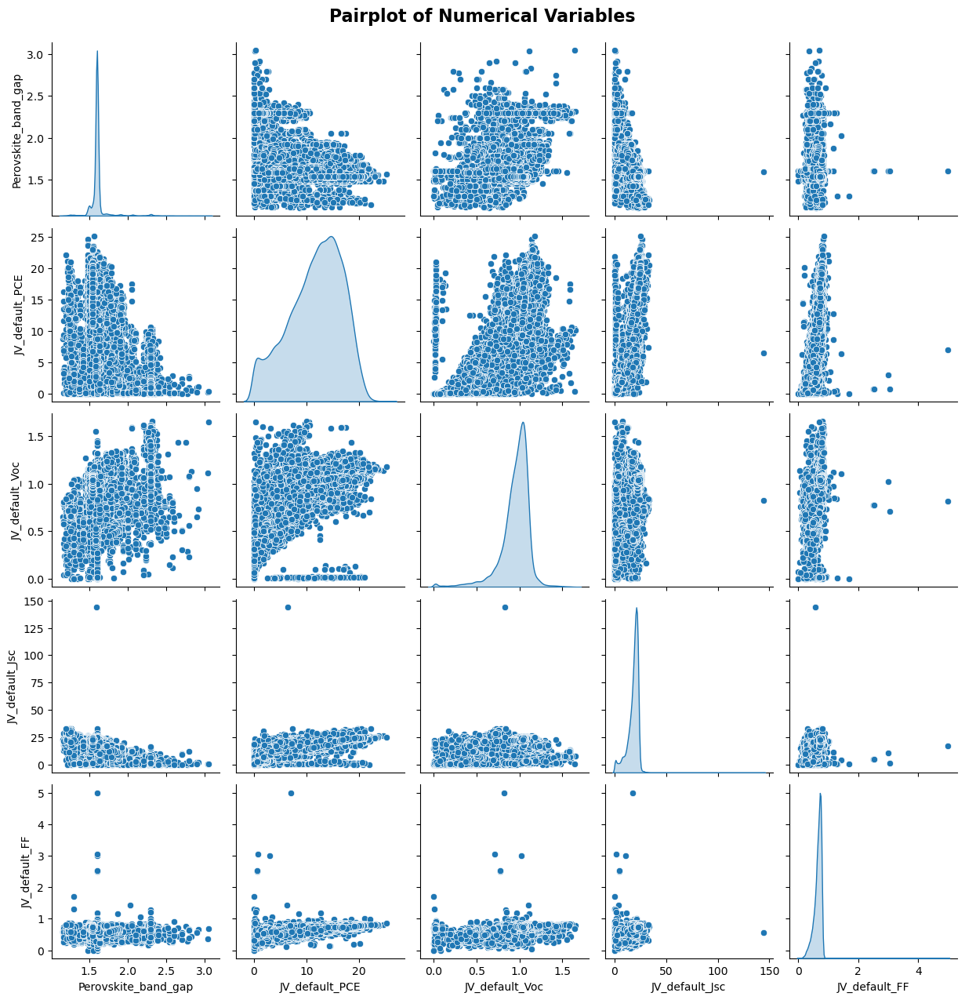

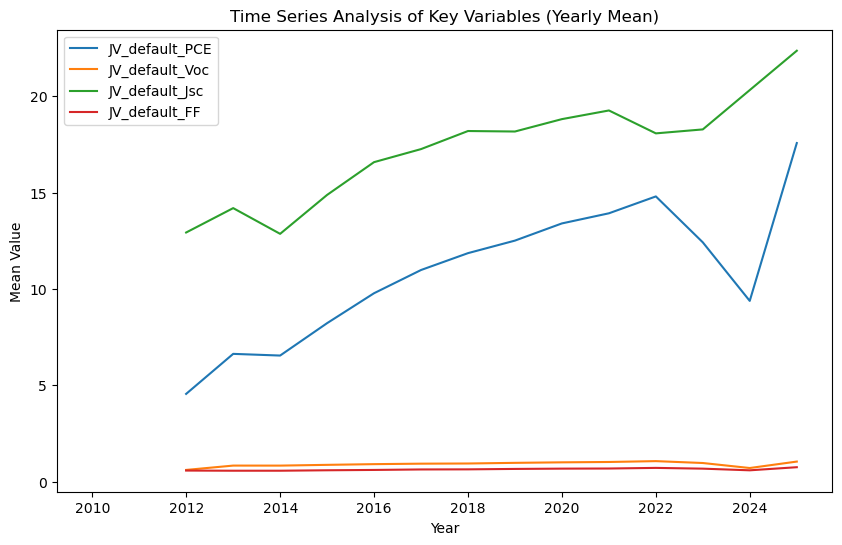

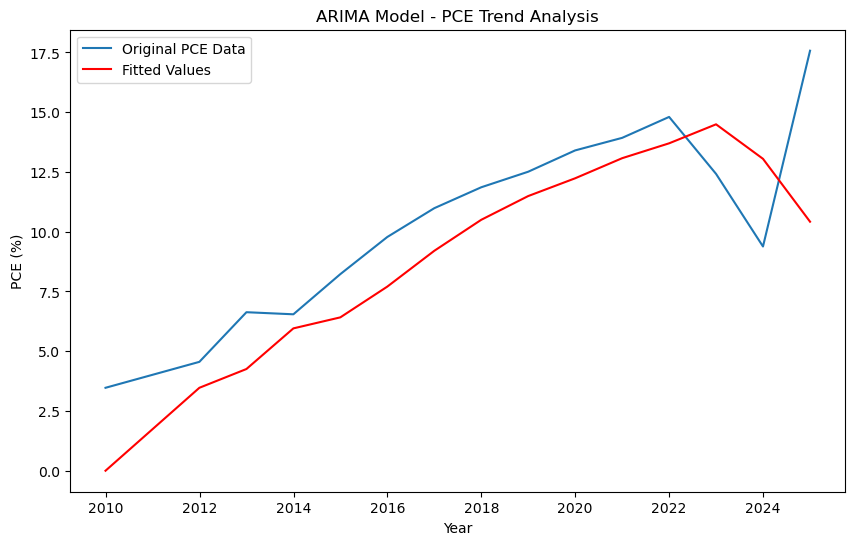

                               SARIMAX Results                                
Dep. Variable:         JV_default_PCE   No. Observations:                   15
Model:                 ARIMA(1, 1, 1)   Log Likelihood                 -33.160
Date:                Wed, 09 Oct 2024   AIC                             72.319
Time:                        15:36:45   BIC                             74.237
Sample:                             0   HQIC                            72.142
                                 - 15                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.0663      3.293     -0.020      0.984      -6.521       6.388
ma.L1         -0.2278      3.332     -0.068      0.946      -6.759       6.303
sigma2         6.6389      5.902      1.125      0.2

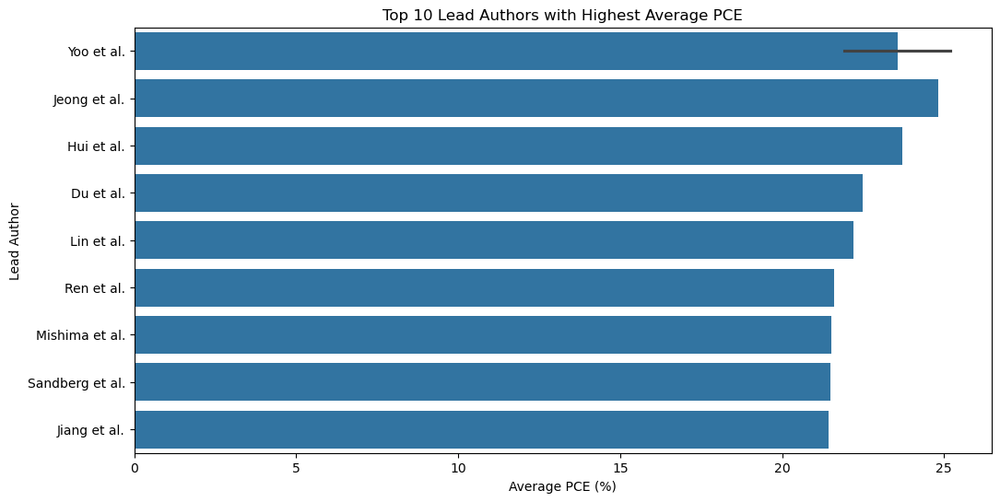

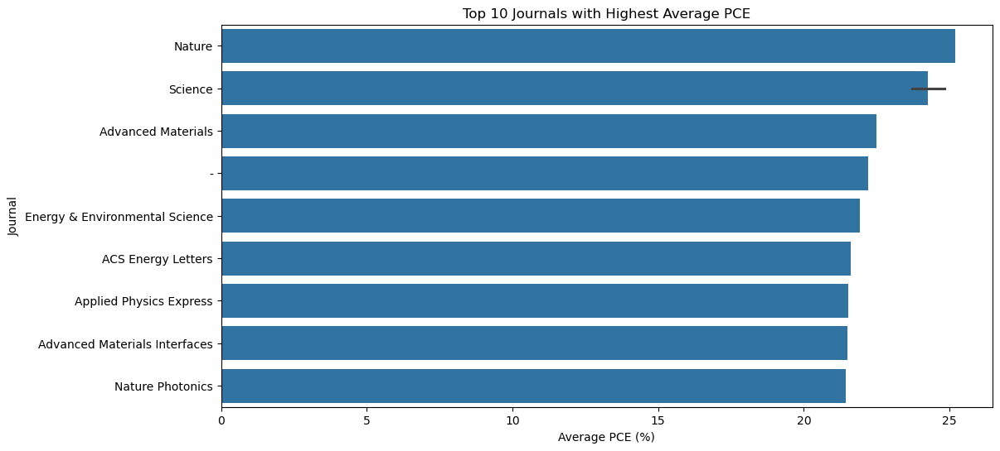

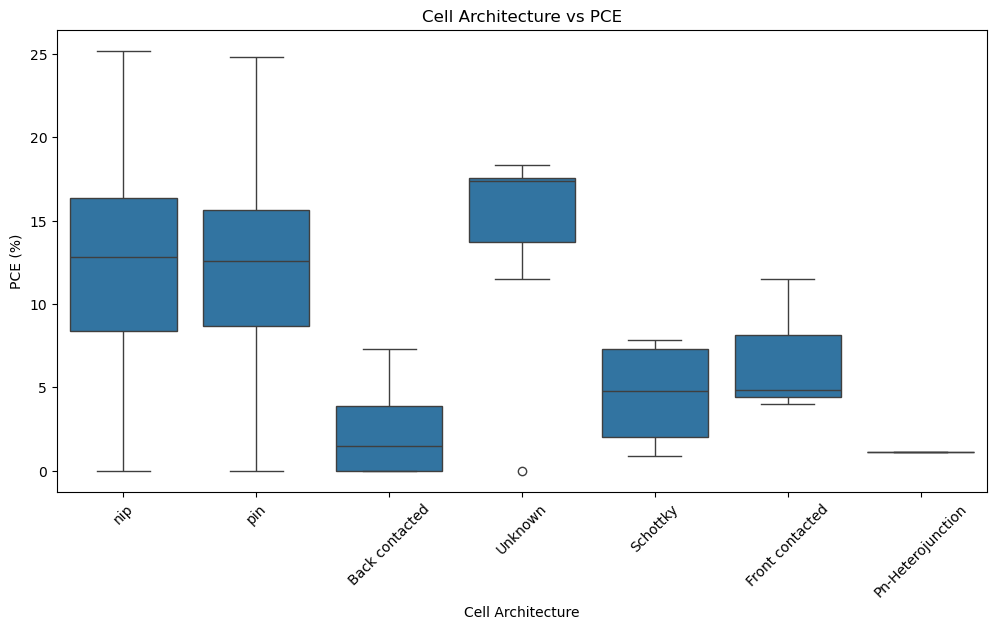

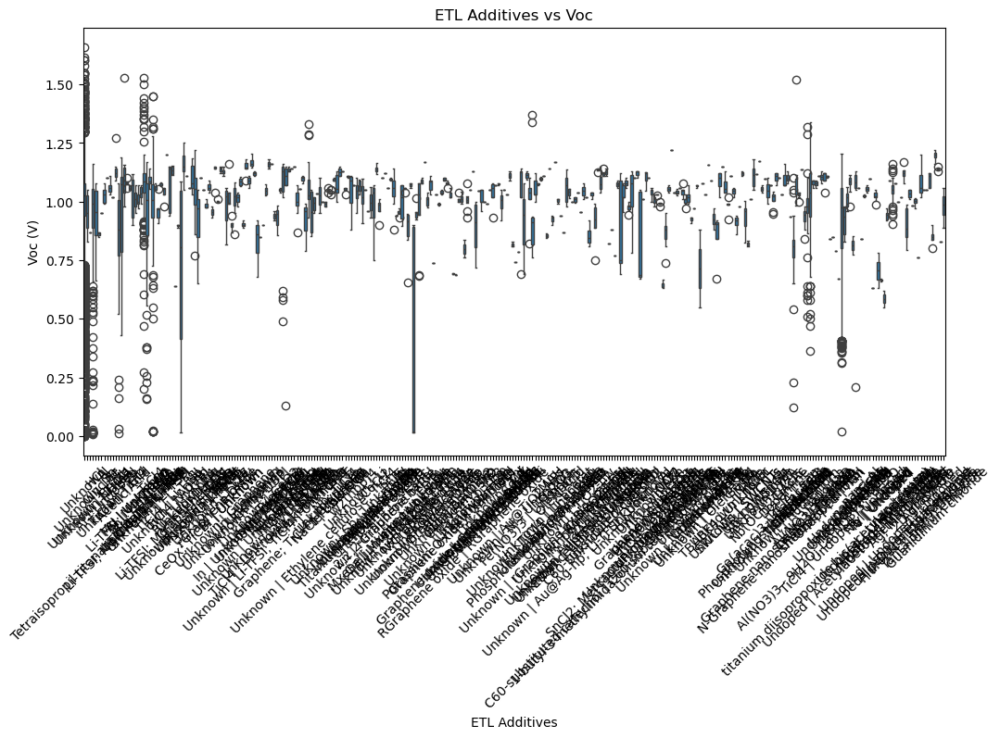

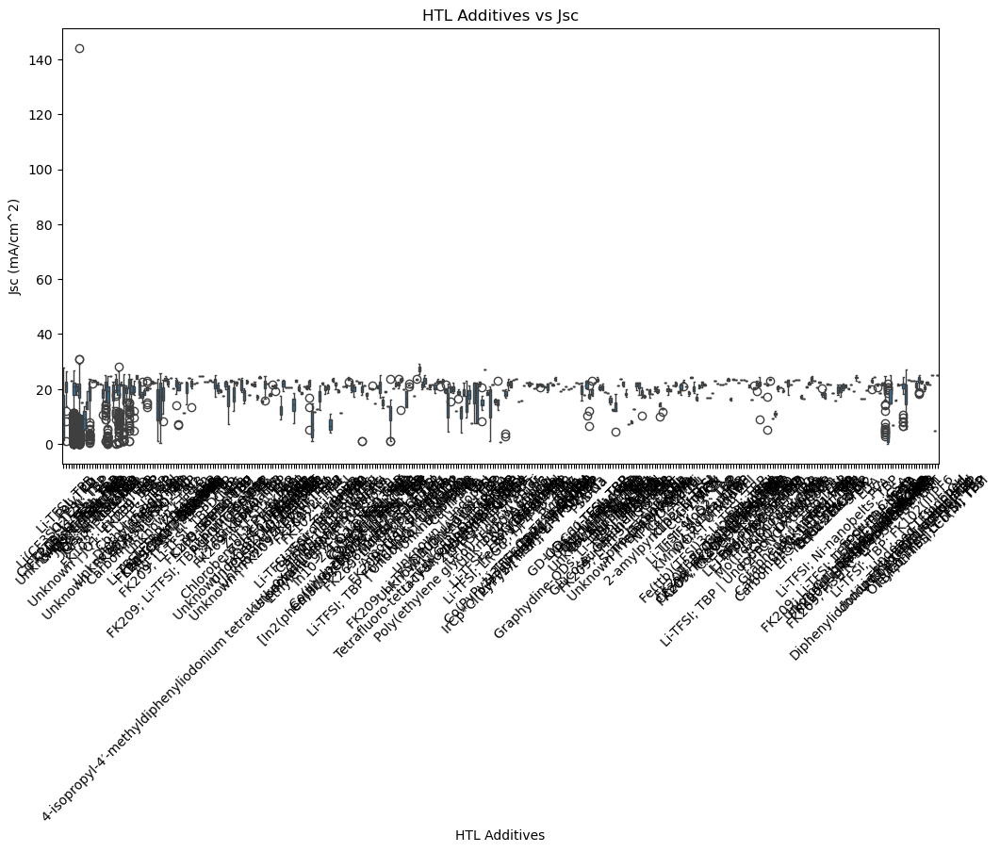

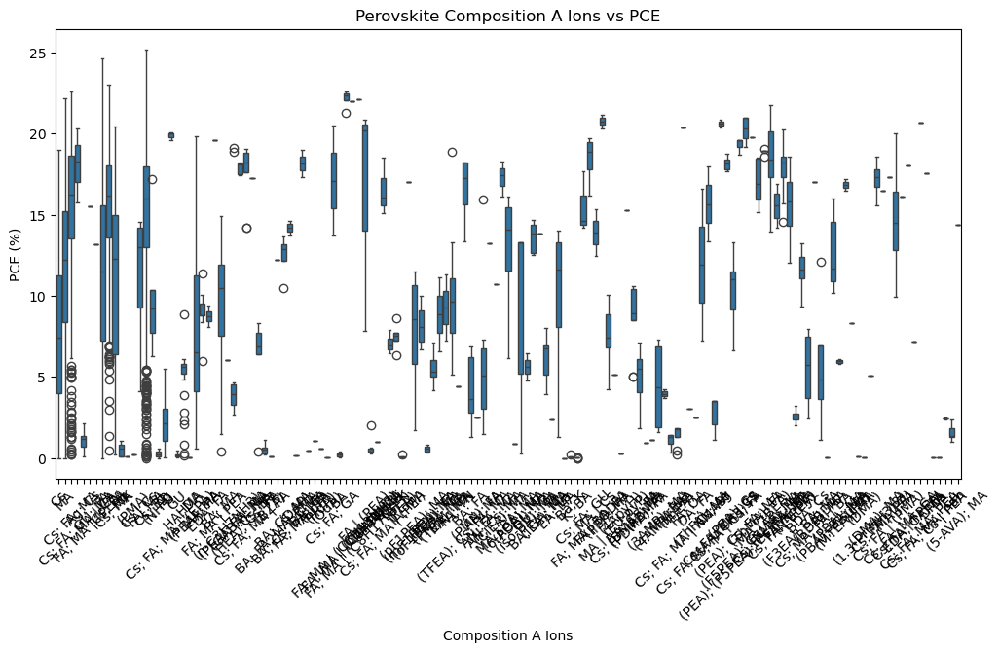

In [15]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
import datetime
from statsmodels.tsa.arima.model import ARIMA
import warnings

# Suppress warnings from statsmodels
warnings.filterwarnings('ignore')

# Load the cleaned perovskite dataset
file_path = 'perovsite_database_query.csv'
data_cleaned = pd.read_csv(file_path)

# Define numerical and categorical columns for analysis
numerical_columns = ['Perovskite_band_gap', 'JV_default_PCE', 'JV_default_Voc', 'JV_default_Jsc', 'JV_default_FF']
categorical_columns = ['Cell_architecture', 'Substrate_supplier', 'ETL_additives_compounds', 'HTL_deposition_procedure', 'Ref_journal']

# Step 1: Data Cleaning
# Reduce the dataset to only the columns required for analysis to reduce memory usage
data_reduced = data_cleaned[numerical_columns + categorical_columns].copy()

# Cleaning numerical columns in-place for reduced dataset to avoid memory issues
for col in numerical_columns:
    # Convert the column to numeric, replacing invalid entries with NaN
    data_reduced[col] = pd.to_numeric(data_reduced[col], errors='coerce')

# Drop rows with NaN values in the key numerical columns after cleaning
data_reduced.dropna(subset=numerical_columns, inplace=True)

# Step 2: Categorical Data Encoding
# Encode categorical variables using Label Encoding
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    data_reduced[col] = le.fit_transform(data_reduced[col].astype(str))
    label_encoders[col] = le

# Step 3: Univariate Analysis
# Creating histograms for numerical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Histograms of Key Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), numerical_columns):
    sns.histplot(data_reduced[col], bins=30, ax=ax, kde=True)
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Adjust layout and display histograms
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 4: Box plots for numerical columns to identify outliers
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=data_reduced[numerical_columns])
plt.title('Boxplot of Numerical Variables')
plt.show()

# Step 5: Categorical Data Analysis
# Count plots for categorical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Count Plots of Categorical Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), categorical_columns):
    sns.countplot(y=data_reduced[col], ax=ax)
    ax.set_title(f'Count of {col}')
    ax.set_ylabel(col)
    ax.set_xlabel('Frequency')

# Adjust layout and display count plots
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 6: Bivariate Analysis
# Scatter plot between Bandgap and PCE
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', data=data_reduced)
plt.title('Scatter Plot: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 7: Correlation matrix and heatmap
corr_matrix = data_reduced.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Perovskite Properties and Categorical Encodings')
plt.show()

# Step 8: Advanced Correlation Analysis
# Calculate Pearson and Spearman correlation coefficients for each pair of numerical variables
print("\nAdvanced Correlation Analysis:\n")
for i in range(len(numerical_columns)):
    for j in range(i + 1, len(numerical_columns)):
        col1 = numerical_columns[i]
        col2 = numerical_columns[j]
        pearson_corr, _ = pearsonr(data_reduced[col1], data_reduced[col2])
        spearman_corr, _ = spearmanr(data_reduced[col1], data_reduced[col2])
        print(f"Pearson correlation between {col1} and {col2}: {pearson_corr:.2f}")
        print(f"Spearman correlation between {col1} and {col2}: {spearman_corr:.2f}\n")

# Step 9: Principal Component Analysis (PCA)
# Perform PCA to reduce dimensionality and understand the variance in the dataset
pca = PCA(n_components=2)
principal_components = pca.fit_transform(data_reduced[numerical_columns])
explained_variance = pca.explained_variance_ratio_

plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c='blue', edgecolor='k', alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title(f'PCA: Explained Variance - PC1: {explained_variance[0]:.2f}, PC2: {explained_variance[1]:.2f}')
plt.show()

# Step 10: Clustering Analysis using KMeans
# Perform KMeans clustering to identify potential groups within the data
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(data_reduced[numerical_columns])
labels = kmeans.labels_

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', hue=labels, palette='viridis', data=data_reduced, legend='full')
plt.title('KMeans Clustering: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 11: Pairplot for Multivariate Analysis
# Visualize pairwise relationships between all numerical variables
sns.pairplot(data_reduced[numerical_columns], diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
plt.show()

# Step 12: Time Series Analysis (if possible)
# Check if there is a time-related column in the dataset
if 'Ref_publication_date' in data_cleaned.columns:
    # Convert the date column to datetime format
    data_cleaned['Ref_publication_date'] = pd.to_datetime(data_cleaned['Ref_publication_date'], errors='coerce')
    
    # Drop rows with NaT values in the date column
    data_cleaned.dropna(subset=['Ref_publication_date'], inplace=True)
    
    # Set the date column as the index for time series analysis
    data_time_series = data_cleaned.set_index('Ref_publication_date')
    
    # Select only numerical columns for resampling
    data_time_series = data_time_series.select_dtypes(include=[np.number])
    
    # Resample data by year and calculate the mean of numerical columns
    yearly_data = data_time_series.resample('Y').mean()
    
    # Plot time series of key variables
    plt.figure(figsize=(10, 6))
    for col in numerical_columns:
        if col in yearly_data.columns:
            plt.plot(yearly_data.index, yearly_data[col], label=col)
    plt.xlabel('Year')
    plt.ylabel('Mean Value')
    plt.title('Time Series Analysis of Key Variables (Yearly Mean)')
    plt.legend()
    plt.show()

    # Step 13: ARIMA Model for Trend Analysis
    # Apply ARIMA model to the yearly data for PCE to understand the trend
    pce_data = yearly_data['JV_default_PCE'].dropna()
    if len(pce_data) > 2:  # ARIMA requires at least 3 data points
        model = ARIMA(pce_data, order=(1, 1, 1))
        model_fit = model.fit()
        
        # Plot the original data and the fitted values
        plt.figure(figsize=(10, 6))
        plt.plot(pce_data.index, pce_data, label='Original PCE Data')
        plt.plot(pce_data.index, model_fit.fittedvalues, color='red', label='Fitted Values')
        plt.xlabel('Year')
        plt.ylabel('PCE (%)')
        plt.title('ARIMA Model - PCE Trend Analysis')
        plt.legend()
        plt.show()

        # Print ARIMA model summary
        print(model_fit.summary())

# Step 14: Impact of Publication and Researcher on Device Performance
# Group data by lead author and journal to observe average PCE
performance_by_author_journal = data_cleaned.groupby(['Ref_lead_author', 'Ref_journal'])['JV_default_PCE'].mean().reset_index()

plt.figure(figsize=(12, 6))
sns.barplot(x='JV_default_PCE', y='Ref_lead_author', data=performance_by_author_journal.sort_values(by='JV_default_PCE', ascending=False).head(10))
plt.title('Top 10 Lead Authors with Highest Average PCE')
plt.xlabel('Average PCE (%)')
plt.ylabel('Lead Author')
plt.show()

plt.figure(figsize=(12, 6))
sns.barplot(x='JV_default_PCE', y='Ref_journal', data=performance_by_author_journal.sort_values(by='JV_default_PCE', ascending=False).head(10))
plt.title('Top 10 Journals with Highest Average PCE')
plt.xlabel('Average PCE (%)')
plt.ylabel('Journal')
plt.show()

# Step 15: Fabrication Process vs. Solar Cell Efficiency
# Analyze which fabrication process yields higher efficiencies
data_fabrication = data_cleaned[['Cell_architecture', 'Substrate_deposition_procedure', 'JV_default_PCE']].dropna()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cell_architecture', y='JV_default_PCE', data=data_fabrication)
plt.title('Cell Architecture vs PCE')
plt.xlabel('Cell Architecture')
plt.ylabel('PCE (%)')
plt.xticks(rotation=45)
plt.show()

# Step 16: Effect of Transport Layer on Device Characteristics
# Analyze how ETL/HTL additives impact Voc and Jsc
etl_htl_effect = data_cleaned[['ETL_additives_compounds', 'HTL_additives_compounds', 'JV_default_Voc', 'JV_default_Jsc']].dropna()

plt.figure(figsize=(12, 6))
sns.boxplot(x='ETL_additives_compounds', y='JV_default_Voc', data=etl_htl_effect)
plt.title('ETL Additives vs Voc')
plt.xlabel('ETL Additives')
plt.ylabel('Voc (V)')
plt.xticks(rotation=45)
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='HTL_additives_compounds', y='JV_default_Jsc', data=etl_htl_effect)
plt.title('HTL Additives vs Jsc')
plt.xlabel('HTL Additives')
plt.ylabel('Jsc (mA/cm^2)')
plt.xticks(rotation=45)
plt.show()

# Step 17: Material Composition and Efficiency
# Investigate which perovskite composition components contribute most to bandgap optimization and PCE
composition_effect = data_cleaned[['Perovskite_composition_a_ions', 'Perovskite_composition_b_ions', 'Perovskite_band_gap', 'JV_default_PCE']].dropna()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Perovskite_composition_a_ions', y='JV_default_PCE', data=composition_effect)
plt.title('Perovskite Composition A Ions vs PCE')
plt.xlabel('Composition A Ions')
plt.ylabel('PCE (%)')
plt.xticks(rotation=45)
plt.show()

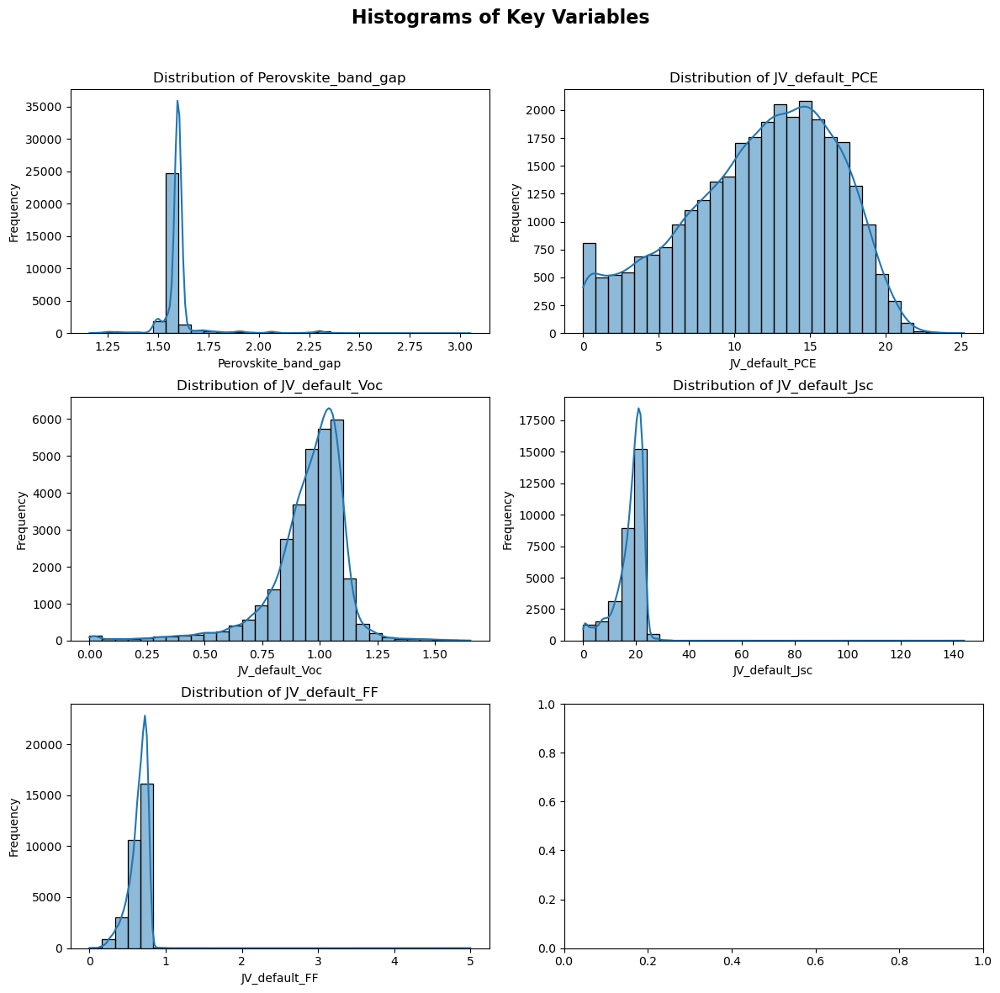

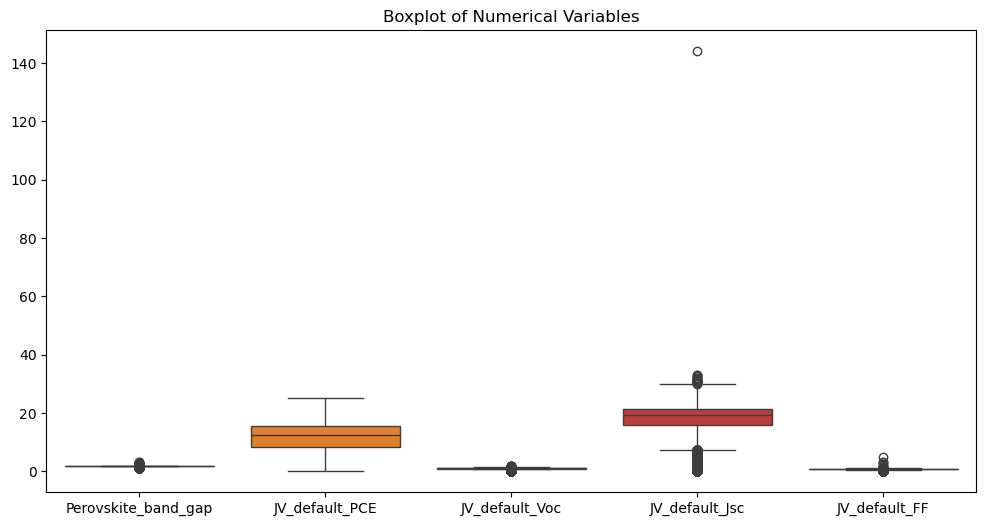

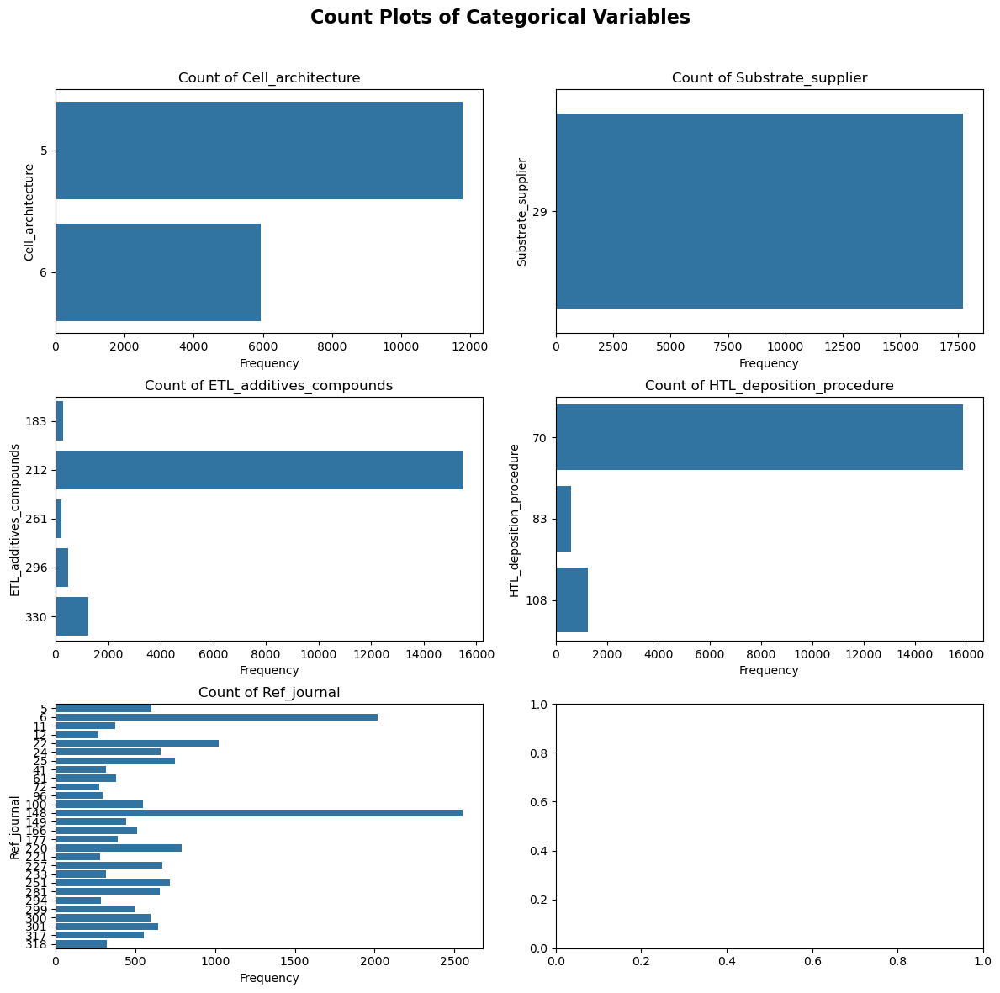

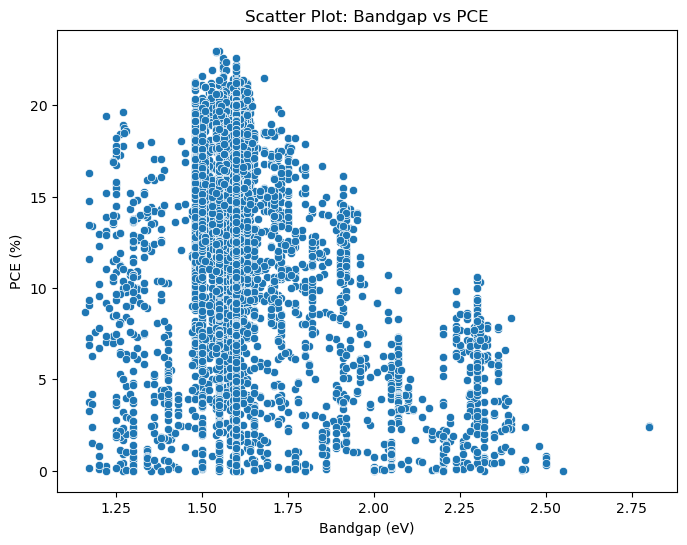

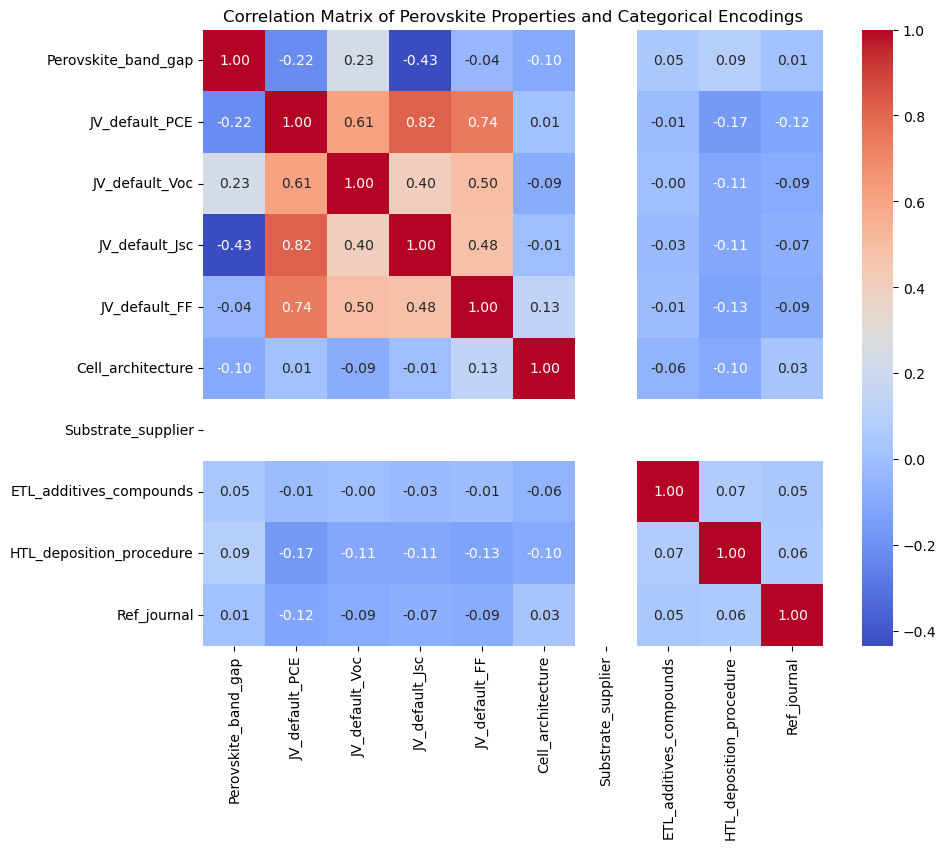


Advanced Correlation Analysis:

Pearson correlation between Perovskite_band_gap and JV_default_PCE: -0.22
Spearman correlation between Perovskite_band_gap and JV_default_PCE: -0.11

Pearson correlation between Perovskite_band_gap and JV_default_Voc: 0.23
Spearman correlation between Perovskite_band_gap and JV_default_Voc: 0.14

Pearson correlation between Perovskite_band_gap and JV_default_Jsc: -0.43
Spearman correlation between Perovskite_band_gap and JV_default_Jsc: -0.24

Pearson correlation between Perovskite_band_gap and JV_default_FF: -0.04
Spearman correlation between Perovskite_band_gap and JV_default_FF: -0.02

Pearson correlation between JV_default_PCE and JV_default_Voc: 0.61
Spearman correlation between JV_default_PCE and JV_default_Voc: 0.69

Pearson correlation between JV_default_PCE and JV_default_Jsc: 0.82
Spearman correlation between JV_default_PCE and JV_default_Jsc: 0.82

Pearson correlation between JV_default_PCE and JV_default_FF: 0.74
Spearman correlation between

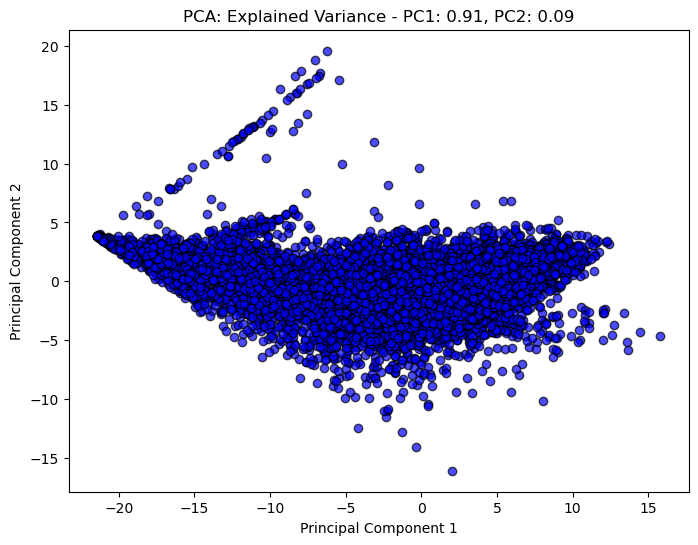

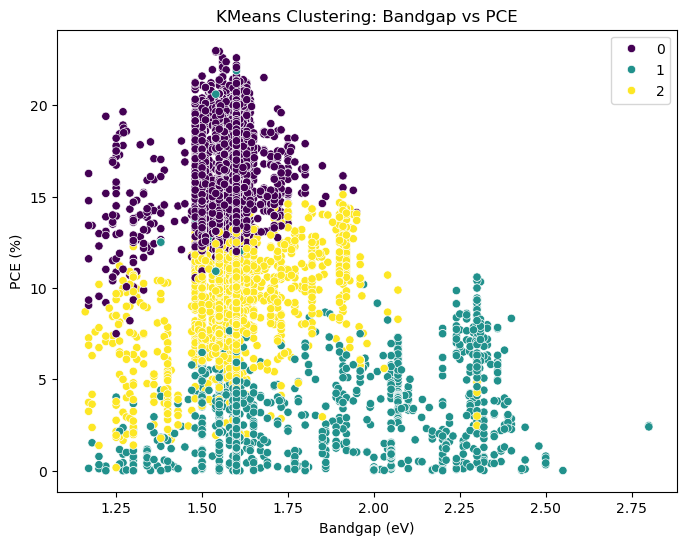

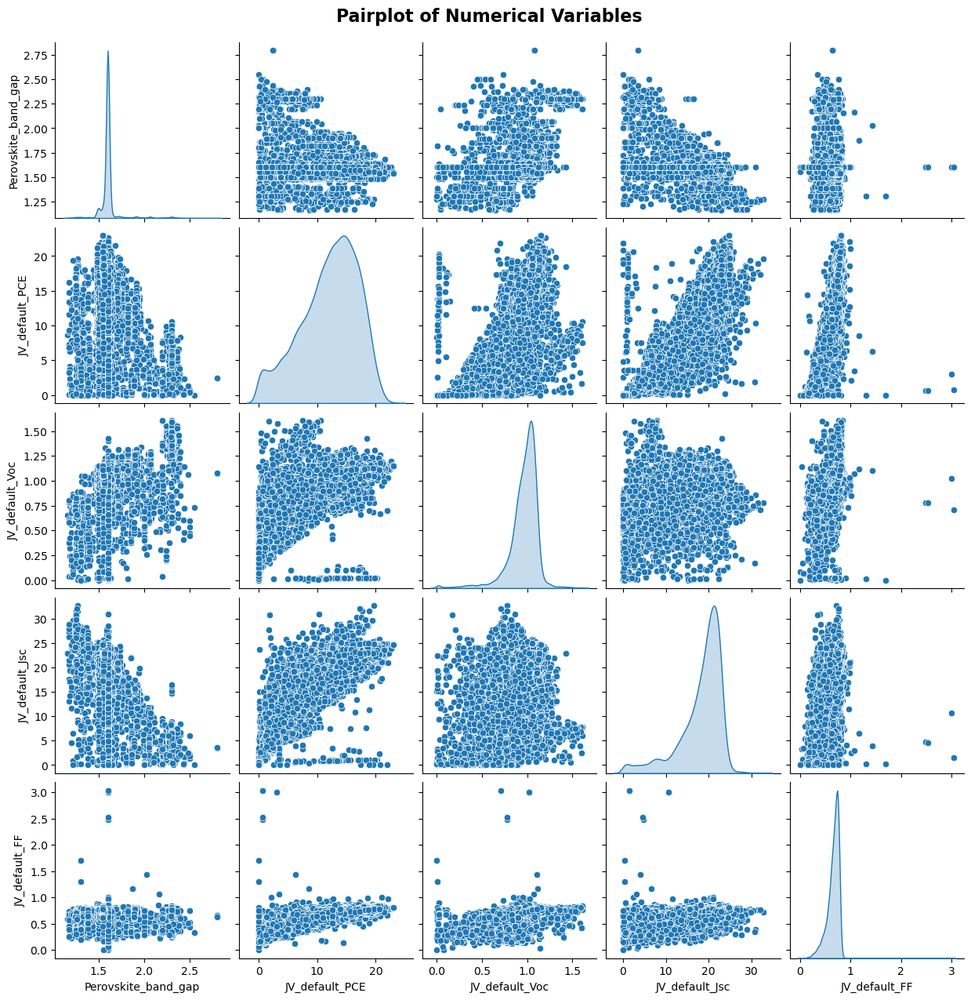

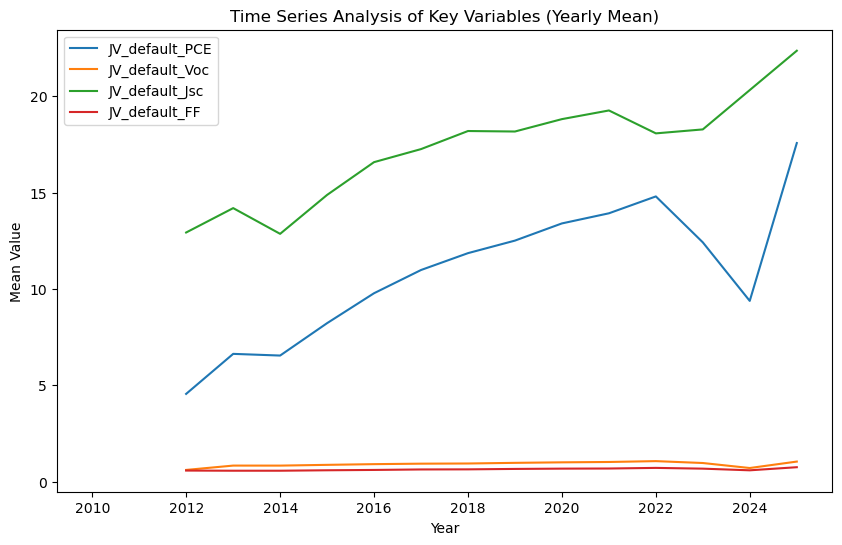

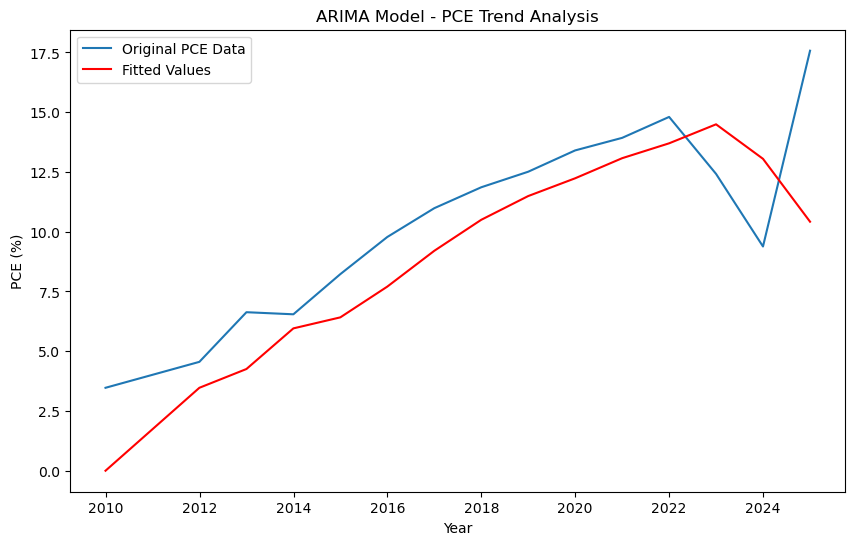

...

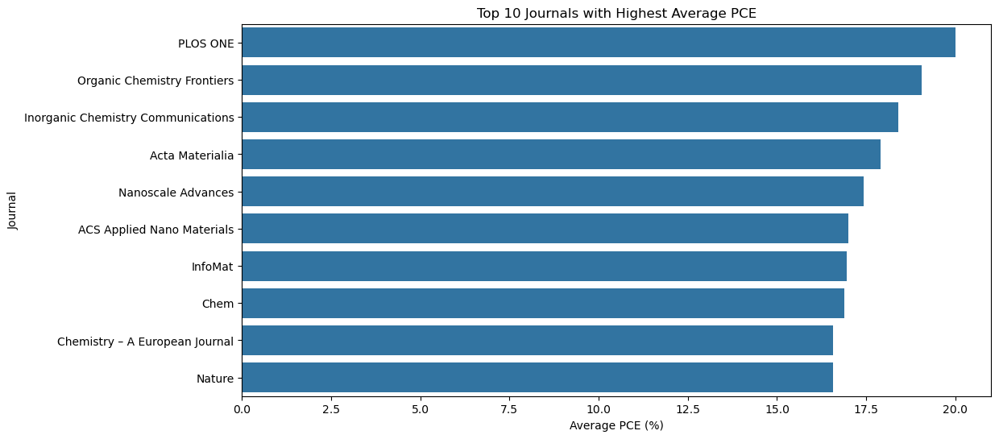

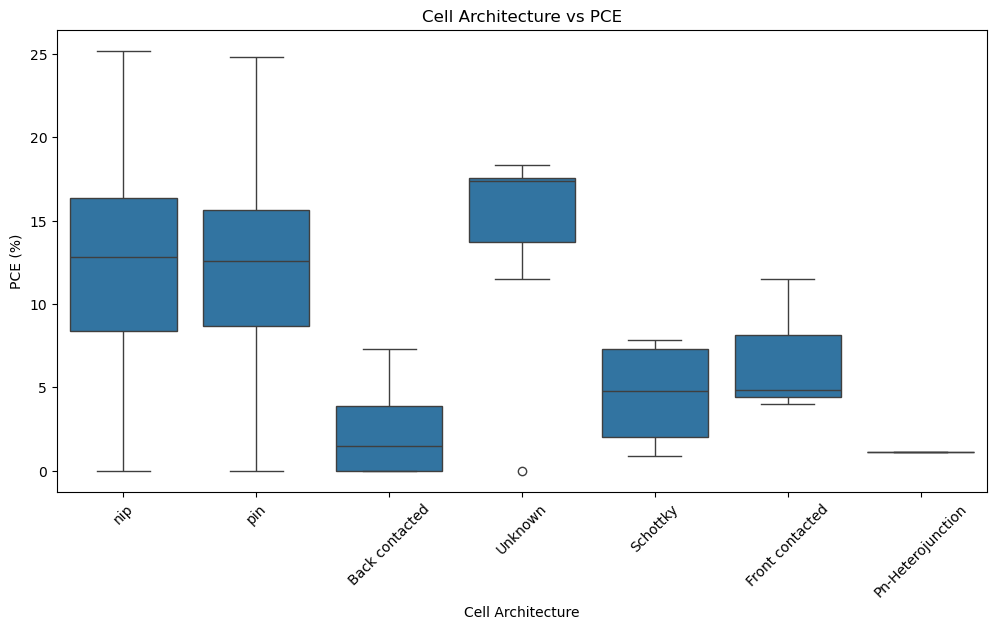

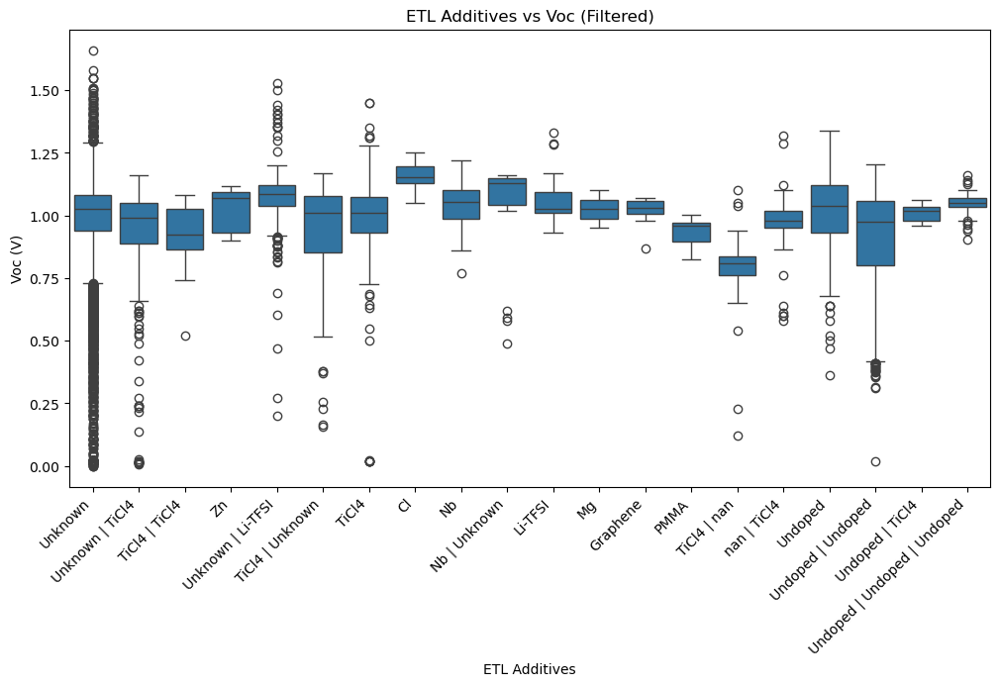

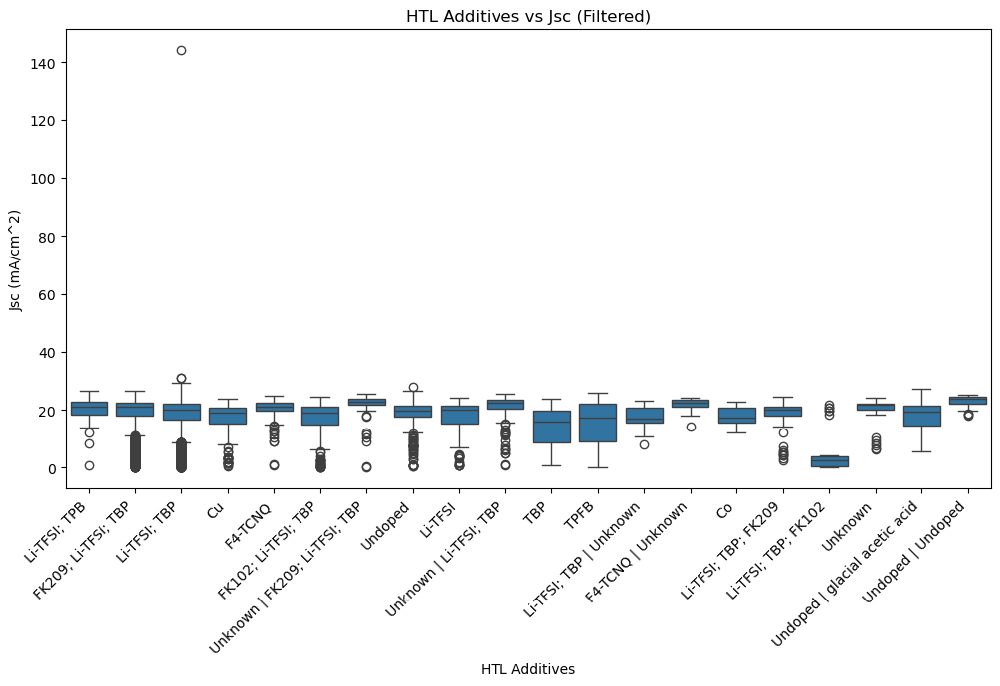

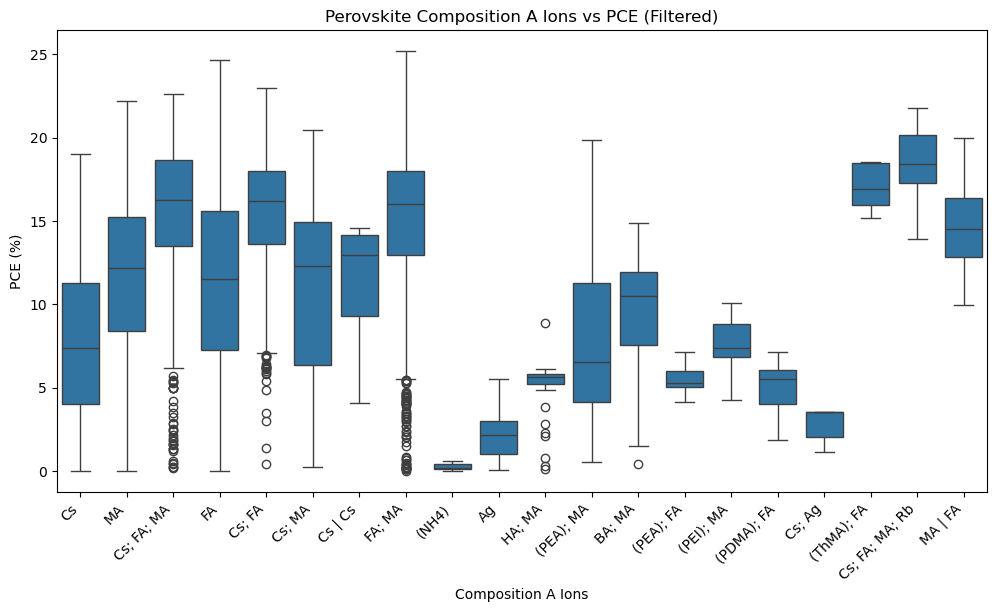

In [16]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr, spearmanr
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.preprocessing import LabelEncoder
import datetime
from statsmodels.tsa.arima.model import ARIMA
import warnings

# Suppress warnings from statsmodels
warnings.filterwarnings('ignore')

# Load the cleaned perovskite dataset
file_path = 'perovsite_database_query.csv'
data_cleaned = pd.read_csv(file_path)

# Define numerical and categorical columns for analysis
numerical_columns = ['Perovskite_band_gap', 'JV_default_PCE', 'JV_default_Voc', 'JV_default_Jsc', 'JV_default_FF']
categorical_columns = ['Cell_architecture', 'Substrate_supplier', 'ETL_additives_compounds', 'HTL_deposition_procedure', 'Ref_journal']

# Step 1: Data Cleaning
# Reduce the dataset to only the columns required for analysis to reduce memory usage
data_reduced = data_cleaned[numerical_columns + categorical_columns].copy()

# Cleaning numerical columns in-place for reduced dataset to avoid memory issues
for col in numerical_columns:
    # Convert the column to numeric, replacing invalid entries with NaN
    data_reduced[col] = pd.to_numeric(data_reduced[col], errors='coerce')

# Drop rows with NaN values in the key numerical columns after cleaning
data_reduced.dropna(subset=numerical_columns, inplace=True)

# Step 2: Categorical Data Encoding
# Encode categorical variables using Label Encoding
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    data_reduced[col] = le.fit_transform(data_reduced[col].astype(str))
    label_encoders[col] = le

# Step 3: Univariate Analysis
# Creating histograms for numerical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Histograms of Key Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), numerical_columns):
    sns.histplot(data_reduced[col], bins=30, ax=ax, kde=True)
    ax.set_title(f'Distribution of {col}')
    ax.set_xlabel(col)
    ax.set_ylabel('Frequency')

# Adjust layout and display histograms
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 4: Box plots for numerical columns to identify outliers
fig, ax = plt.subplots(figsize=(12, 6))
sns.boxplot(data=data_reduced[numerical_columns])
plt.title('Boxplot of Numerical Variables')
plt.show()

# Step 5: Categorical Data Analysis
# Filter out rare categories for categorical columns
filtered_data = data_reduced.copy()
for col in categorical_columns:
    value_counts = filtered_data[col].value_counts()
    # Keep only categories that occur more than 1% of the time
    common_categories = value_counts[value_counts > (0.01 * len(filtered_data))].index
    filtered_data = filtered_data[filtered_data[col].isin(common_categories)]

# Count plots for filtered categorical columns
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(12, 12))
fig.suptitle('Count Plots of Categorical Variables', fontsize=16, fontweight='bold')

for ax, col in zip(axes.flatten(), categorical_columns):
    sns.countplot(y=filtered_data[col], ax=ax)
    ax.set_title(f'Count of {col}')
    ax.set_ylabel(col)
    ax.set_xlabel('Frequency')

# Adjust layout and display count plots
plt.tight_layout()
plt.subplots_adjust(top=0.9)
plt.show()

# Step 6: Bivariate Analysis
# Scatter plot between Bandgap and PCE
plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', data=filtered_data)
plt.title('Scatter Plot: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 7: Correlation matrix and heatmap
corr_matrix = filtered_data.corr()

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.title('Correlation Matrix of Perovskite Properties and Categorical Encodings')
plt.show()

# Step 8: Advanced Correlation Analysis
# Calculate Pearson and Spearman correlation coefficients for each pair of numerical variables
print("\nAdvanced Correlation Analysis:\n")
for i in range(len(numerical_columns)):
    for j in range(i + 1, len(numerical_columns)):
        col1 = numerical_columns[i]
        col2 = numerical_columns[j]
        pearson_corr, _ = pearsonr(filtered_data[col1], filtered_data[col2])
        spearman_corr, _ = spearmanr(filtered_data[col1], filtered_data[col2])
        print(f"Pearson correlation between {col1} and {col2}: {pearson_corr:.2f}")
        print(f"Spearman correlation between {col1} and {col2}: {spearman_corr:.2f}\n")

# Step 9: Principal Component Analysis (PCA)
# Perform PCA to reduce dimensionality and understand the variance in the dataset
pca = PCA(n_components=2)
principal_components = pca.fit_transform(filtered_data[numerical_columns])
explained_variance = pca.explained_variance_ratio_

plt.figure(figsize=(8, 6))
plt.scatter(principal_components[:, 0], principal_components[:, 1], c='blue', edgecolor='k', alpha=0.7)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title(f'PCA: Explained Variance - PC1: {explained_variance[0]:.2f}, PC2: {explained_variance[1]:.2f}')
plt.show()

# Step 10: Clustering Analysis using KMeans
# Perform KMeans clustering to identify potential groups within the data
kmeans = KMeans(n_clusters=3, random_state=42)
kmeans.fit(filtered_data[numerical_columns])
labels = kmeans.labels_

plt.figure(figsize=(8, 6))
sns.scatterplot(x='Perovskite_band_gap', y='JV_default_PCE', hue=labels, palette='viridis', data=filtered_data, legend='full')
plt.title('KMeans Clustering: Bandgap vs PCE')
plt.xlabel('Bandgap (eV)')
plt.ylabel('PCE (%)')
plt.show()

# Step 11: Pairplot for Multivariate Analysis
# Visualize pairwise relationships between all numerical variables
sns.pairplot(filtered_data[numerical_columns], diag_kind='kde')
plt.suptitle('Pairplot of Numerical Variables', y=1.02, fontsize=16, fontweight='bold')
plt.show()

# Step 12: Time Series Analysis (if possible)
# Check if there is a time-related column in the dataset
if 'Ref_publication_date' in data_cleaned.columns:
    # Convert the date column to datetime format
    data_cleaned['Ref_publication_date'] = pd.to_datetime(data_cleaned['Ref_publication_date'], errors='coerce')
    
    # Drop rows with NaT values in the date column
    data_cleaned.dropna(subset=['Ref_publication_date'], inplace=True)
    
    # Set the date column as the index for time series analysis
    data_time_series = data_cleaned.set_index('Ref_publication_date')
    
    # Select only numerical columns for resampling
    data_time_series = data_time_series.select_dtypes(include=[np.number])
    
    # Resample data by year and calculate the mean of numerical columns
    yearly_data = data_time_series.resample('Y').mean()
    
    # Plot time series of key variables
    plt.figure(figsize=(10, 6))
    for col in numerical_columns:
        if col in yearly_data.columns:
            plt.plot(yearly_data.index, yearly_data[col], label=col)
    plt.xlabel('Year')
    plt.ylabel('Mean Value')
    plt.title('Time Series Analysis of Key Variables (Yearly Mean)')
    plt.legend()
    plt.show()

    # Step 13: ARIMA Model for Trend Analysis
    # Apply ARIMA model to the yearly data for PCE to understand the trend
    pce_data = yearly_data['JV_default_PCE'].dropna()
    if len(pce_data) > 2:  # ARIMA requires at least 3 data points
        model = ARIMA(pce_data, order=(1, 1, 1))
        model_fit = model.fit()
        
        # Plot the original data and the fitted values
        plt.figure(figsize=(10, 6))
        plt.plot(pce_data.index, pce_data, label='Original PCE Data')
        plt.plot(pce_data.index, model_fit.fittedvalues, color='red', label='Fitted Values')
        plt.xlabel('Year')
        plt.ylabel('PCE (%)')
        plt.title('ARIMA Model - PCE Trend Analysis')
        plt.legend()
        plt.show()

# Step 14: Impact of Publication and Researcher on Device Performance
# Group data by lead author and journal to observe average PCE
performance_by_author_journal = data_cleaned.groupby(['Ref_lead_author', 'Ref_journal'])['JV_default_PCE'].mean().reset_index()

# Plot top lead authors with highest average PCE
top_authors = performance_by_author_journal.groupby('Ref_lead_author')['JV_default_PCE'].mean().reset_index()
top_authors = top_authors.sort_values(by='JV_default_PCE', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x='JV_default_PCE', y='Ref_lead_author', data=top_authors)
plt.title('Top 10 Lead Authors with Highest Average PCE')
plt.xlabel('Average PCE (%)')
plt.ylabel('Lead Author')
plt.show()

# Plot top journals with highest average PCE
top_journals = performance_by_author_journal.groupby('Ref_journal')['JV_default_PCE'].mean().reset_index()
top_journals = top_journals.sort_values(by='JV_default_PCE', ascending=False).head(10)

plt.figure(figsize=(12, 6))
sns.barplot(x='JV_default_PCE', y='Ref_journal', data=top_journals)
plt.title('Top 10 Journals with Highest Average PCE')
plt.xlabel('Average PCE (%)')
plt.ylabel('Journal')
plt.show()

# Step 15: Fabrication Process vs. Solar Cell Efficiency
# Analyze which fabrication process yields higher efficiencies
data_fabrication = data_cleaned[['Cell_architecture', 'Substrate_deposition_procedure', 'JV_default_PCE']].dropna()

plt.figure(figsize=(12, 6))
sns.boxplot(x='Cell_architecture', y='JV_default_PCE', data=data_fabrication)
plt.title('Cell Architecture vs PCE')
plt.xlabel('Cell Architecture')
plt.ylabel('PCE (%)')
plt.xticks(rotation=45)
plt.show()

# Step 16: Effect of Transport Layer on Device Characteristics
# Analyze how ETL/HTL additives impact Voc and Jsc
etl_htl_effect = data_cleaned[['ETL_additives_compounds', 'HTL_additives_compounds', 'JV_default_Voc', 'JV_default_Jsc']].dropna()

# Filter to top 20 most common ETL and HTL additives for better visualization
etl_counts = etl_htl_effect['ETL_additives_compounds'].value_counts().head(20).index
htl_counts = etl_htl_effect['HTL_additives_compounds'].value_counts().head(20).index
etl_htl_effect_filtered = etl_htl_effect[etl_htl_effect['ETL_additives_compounds'].isin(etl_counts) & etl_htl_effect['HTL_additives_compounds'].isin(htl_counts)]

plt.figure(figsize=(12, 6))
sns.boxplot(x='ETL_additives_compounds', y='JV_default_Voc', data=etl_htl_effect_filtered)
plt.title('ETL Additives vs Voc (Filtered)')
plt.xlabel('ETL Additives')
plt.ylabel('Voc (V)')
plt.xticks(rotation=45, ha='right')
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(x='HTL_additives_compounds', y='JV_default_Jsc', data=etl_htl_effect_filtered)
plt.title('HTL Additives vs Jsc (Filtered)')
plt.xlabel('HTL Additives')
plt.ylabel('Jsc (mA/cm^2)')
plt.xticks(rotation=45, ha='right')
plt.show()

# Step 17: Material Composition and Efficiency
# Investigate which perovskite composition components contribute most to bandgap optimization and PCE
composition_effect = data_cleaned[['Perovskite_composition_a_ions', 'Perovskite_composition_b_ions', 'Perovskite_band_gap', 'JV_default_PCE']].dropna()

# Filter to top 20 most common A ions for better visualization
a_ion_counts = composition_effect['Perovskite_composition_a_ions'].value_counts().head(20).index
composition_effect_filtered = composition_effect[composition_effect['Perovskite_composition_a_ions'].isin(a_ion_counts)]

plt.figure(figsize=(12, 6))
sns.boxplot(x='Perovskite_composition_a_ions', y='JV_default_PCE', data=composition_effect_filtered)
plt.title('Perovskite Composition A Ions vs PCE (Filtered)')
plt.xlabel('Composition A Ions')
plt.ylabel('PCE (%)')
plt.xticks(rotation=45, ha='right')
plt.show()
